In [62]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from IPython.display import display

from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import SGDClassifier

In [2]:
pd.set_option("display.max_rows", 621)
pd.set_option("display.max_columns", 621)

In [3]:
data = pd.read_csv("CES19.csv")
data.head()

C:\Users\Kqn23\AppData\Local\Temp\ipykernel_6344\3662213025.py:1: DtypeWarning: Columns (25,27,28,30,31,33,34,39,179,181,188,192,193,199,210,227,234,236,237,239,240,243,276,299,302,311,314,315,316,327,362,417,418,421,422,423,424,425,431,464,465,468,538,541,578,579,582,583,584) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("CES19.csv")


,Unnamed: 0,cps19_StartDate,cps19_EndDate,cps19_ResponseId,cps19_consent,cps19_citizenship,cps19_yob,cps19_yob_2001_age,cps19_gender,cps19_province,cps19_education,cps19_demsat,cps19_imp_iss,cps19_imp_iss_party,cps19_imp_iss_party_7_TEXT,cps19_imp_loc_iss,cps19_imp_loc_iss_p,cps19_imp_loc_iss_p_7_TEXT,cps19_interest_gen_1,cps19_interest_elxn_1,cps19_v_likely,cps19_v_likely_pr,cps19_votechoice,cps19_votechoice_7_TEXT,cps19_votechoice_pr,cps19_votechoice_pr_7_TEXT,cps19_vote_unlikely,cps19_vote_unlikely_7_TEXT,cps19_vote_unlike_pr,cps19_vote_unlike_pr_7_TEXT,cps19_v_advance,cps19_v_advance_7_TEXT,cps19_vote_lean,cps19_vote_lean_7_TEXT,cps19_vote_lean_pr,cps19_vote_lean_pr_7_TEXT,cps19_2nd_choice,cps19_2nd_choice_7_TEXT,cps19_2nd_choice_pr,cps19_2nd_choice_pr_7_TEXT,cps19_not_vote_for_1,cps19_not_vote_for_2,cps19_not_vote_for_3,cps19_not_vote_for_4,cps19_not_vote_for_5,cps19_not_vote_for_6,cps19_not_vote_for_7,cps19_not_vote_for_8,cps19_not_vote_for_9,cps19_not_vote_for_7_TEXT,cps19_fed_gov_sat,cps19_party_rating_23,cps19_party_rating_24,cps19_party_rating_25,cps19_party_rating_26,cps19_party_rating_27,cps19_party_rating_28,cps19_lead_rating_23,cps19_lead_rating_24,cps19_lead_rating_25,cps19_lead_rating_26,cps19_lead_rating_27,cps19_lead_rating_28,cps19_cand_rating_23,cps19_cand_rating_24,cps19_cand_rating_25,cps19_cand_rating_26,cps19_cand_rating_27,cps19_cand_rating_28,cps19_lr_scale_bef_1,cps19_lr_parties_1,cps19_lr_parties_2,cps19_lr_parties_3,cps19_lr_parties_4,cps19_lr_parties_5,cps19_lr_parties_6,cps19_lr_scale_aft_1,cps19_lead_int_113,cps19_lead_int_114,cps19_lead_int_115,cps19_lead_int_116,cps19_lead_int_117,cps19_lead_int_118,cps19_lead_int_119,cps19_lead_int_120,cps19_lead_strong_113,cps19_lead_strong_114,cps19_lead_strong_115,cps19_lead_strong_116,cps19_lead_strong_117,cps19_lead_strong_118,cps19_lead_strong_119,cps19_lead_strong_120,cps19_lead_trust_113,cps19_lead_trust_114,cps19_lead_trust_115,cps19_lead_trust_116,cps19_lead_trust_117,cps19_lead_trust_118,cps19_lead_trust_119,cps19_lead_trust_120,cps19_lead_cares_113,cps19_lead_cares_114,cps19_lead_cares_115,cps19_lead_cares_116,cps19_lead_cares_117,cps19_lead_cares_118,cps19_lead_cares_119,cps19_lead_cares_120,cps19_spend_educ,cps19_spend_env,cps19_spend_just_law,cps19_spend_defence,cps19_spend_imm_min,cps19_pos_fptp,cps19_pos_life,cps19_pos_cannabis,cps19_pos_carbon,cps19_pos_energy,cps19_pos_envreg,cps19_pos_jobs,cps19_pos_subsid,cps19_pos_trade,cps19_econ_retro,cps19_econ_fed,cps19_ownfinanc_fed,cps19_issue_handle_1,cps19_issue_handle_2,cps19_issue_handle_3,cps19_issue_handle_4,cps19_issue_handle_5,cps19_issue_handle_6,cps19_issue_handle_7,cps19_issue_handle_8,cps19_most_seats_1,cps19_most_seats_2,cps19_most_seats_3,cps19_most_seats_4,cps19_most_seats_5,cps19_most_seats_6,cps19_win_local_1,cps19_win_local_2,cps19_win_local_3,cps19_win_local_4,cps19_win_local_5,cps19_win_local_6,cps19_outcome_most,cps19_outcome_most_14_TEXT,cps19_outcome_least,cps19_outcome_least_14_TEXT,cps19_imm,cps19_refugees,cps19_govt_confusing,cps19_govt_say,cps19_pol_eth,cps19_lib_promises,cps19_snclav,cps19_news_cons,cps19_volunteer,cps19_duty_choice,cps19_quebec_sov,cps19_own_fin_retro,cps19_premier_name,cps19_finmin_name,cps19_govgen_name,cps19_presrus_name,cps19_prov_gov_sat,cps19_fed_id,cps19_fed_id_7_TEXT,cps19_fed_id_str,cps19_prov_id,cps19_prov_id_295_TEXT,cps19_prov_id_str,cps19_party_member_36,cps19_party_member_37,cps19_party_member_38,cps19_party_member_39,cps19_party_member_40,cps19_fed_member,cps19_fed_member_62_TEXT,cps19_prov_member,cps19_prov_member_295_TEXT,cps19_fed_donate,cps19_groups_therm_1,cps19_groups_therm_2,cps19_groups_therm_3,cps19_groups_therm_4,cps19_groups_therm_5,cps19_spoil,cps19_turnout_2015,cps19_vote_2015,cps19_vote_2015_6_TEXT,cps19_debate_en,cps19_debate_fr,cps19_religion,cps19_religion_22_TEXT,cps19_rel_imp,cps19_bornin_canada,cps19_bornin_other,cps19_imm_year,cps19_ethnicity_23,cps19_ethnicity_24,cps19_ethnicity_25,cps19_ethnicity_26,cps19_ethnicity_

In [7]:
data.describe()

,Unnamed: 0,cps19_yob,cps19_yob_2001_age,cps19_interest_gen_1,cps19_interest_elxn_1,cps19_vote_unlike_pr_7_TEXT,cps19_vote_lean_pr_7_TEXT,cps19_party_rating_23,cps19_party_rating_24,cps19_party_rating_25,cps19_party_rating_26,cps19_party_rating_27,cps19_party_rating_28,cps19_lead_rating_23,cps19_lead_rating_24,cps19_lead_rating_25,cps19_lead_rating_26,cps19_lead_rating_27,cps19_lead_rating_28,cps19_cand_rating_23,cps19_cand_rating_24,cps19_cand_rating_25,cps19_cand_rating_26,cps19_cand_rating_27,cps19_cand_rating_28,cps19_lr_scale_bef_1,cps19_lr_parties_1,cps19_lr_parties_2,cps19_lr_parties_3,cps19_lr_parties_4,cps19_lr_parties_5,cps19_lr_parties_6,cps19_lr_scale_aft_1,cps19_most_seats_1,cps19_most_seats_2,cps19_most_seats_3,cps19_most_seats_4,cps19_most_seats_5,cps19_most_seats_6,cps19_win_local_1,cps19_win_local_2,cps19_win_local_3,cps19_win_local_4,cps19_win_local_5,cps19_win_local_6,cps19_groups_therm_1,cps19_groups_therm_2,cps19_groups_therm_3,cps19_groups_therm_4,cps19_groups_therm_5,cps19_income_number,cps19_household,cps19_current_date,cps19_current_date_string,cps19_Q_TotalDuration,get_news,get_more_naming,get_not_vote_for,get_party_issue_handling,get_imp_loc_iss,get_outcome,cps19_data_quality,cps19_age,cps19_duplicates_flag,cps19_inattentive,constituencynumber,pes19_pr_votechoice,pes19_pr_votechoice_7_TEXT,pes19_groups1_1,pes19_groups1_2,pes19_groups1_3,pes19_groups1_4,pes19_country_1,pes19_country_2,pes19_country_3,pes19_country_4,pes19_party_rate_10,pes19_party_rate_11,pes19_party_rate_12,pes19_party_rate_13,pes19_party_rate_14,pes19_lead_rate_7,pes19_lead_rate_8,pes19_lead_rate_9,pes19_lead_rate_10,pes19_lead_rate_11,pes19_lr_parties_1,pes19_lr_parties_2,pes19_lr_parties_3,pes19_lr_parties_4,pes19_lr_parties_5,pes19_lr_self_1,pes19_emb7_2,pes19_emb7_3,pes19_emb7_5,pes19_interest_1,pes19_diff_power_1,pes19_diff_happens_1,pes19_feminine_1,pes19_masculine_1,pes19_big5_1,pes19_big5_2,pes19_big5_3,pes19_big5_4,pes19_big5_5,pes19_big5_6,pes19_big5_7,pes19_big5_8,pes19_big5_9,pes19_big5_10,pes19_yob,pes19_current_date,pes19_current_date_string,pes19_Q_TotalDuration,split_taxes,split_senate,split_trade,split_lifesat,split_responsibility,split_sexism,split_abortion,split_getahead,split_att_div,split_govt_eff,split_medical,split_ties,split_health_followups,split_gender_id,split_big5,split_hatespeech,split_vol_assoc,pes19_data_quality,pes19_age,pes19_duplicates_flag,pes19_inattentive,cps19_weight_general_all,cps19_weight_general_restricted,pes19_weight_general_all,pes19_weight_general_restricted
count,37822.000000,37822.000000,293.0,35409.000000,35536.000000,0.0,0.0,35176.000000,35022.000000,33962.000000,33916.000000,33136.000000,32725.000000,35406.000000,34054.000000,33310.000000,31898.000000,32227.000000,32418.000000,29331.000000,29106.000000,27680.000000,6287.000000,26886.000000,27094.000000,14503.000000,27743.000000,28210.000000,27351.000000,25445.000000,26639.000000,25781.000000,14833.000000,30479.000000,30014.000000,30206.000000,30273.000000,30346.000000,30166.000000,29532.000000,29089.000000,28414.000000,5998.000000,28170.000000,28063.000000,31088.000000,31574.000000,30946.000000,31639.000000,31988.000000,2.555600e+04,3.591600e+04,3.782200e+04,3.782200e+04,3.782200e+04,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37822.000000,37262.000000,0.0,0.0,9212.000000,9082.000000,9115.000000,9319.000000,5035.000000,4813.000000,4813.000000,4607.000000,4998.000000,5017.000000,4968.000000,4564.000000,4742.000000,4952.000000,5059.000000,4897.000000,4705.000000,4048.000000,4366.00000,4315.000000,4317.000000,4261.000000,4174.000000,4369.000000,5085.000000,5093.000000,5057.000000,9952.000000,9843.000000,9790.000000,4711.000000,4756.000000,4881.000000,4938.000000,5057.000000,4926.000000,4980.000000,4934.000000,4991.000000,5020.000000,4947.000000,4881.000000,10340.000000,1.034000e+04,1.034000e+04,10340.000000,10340.000000,10340.000000,10340.000000,10340.000000,10340

In [8]:
my_columns = ["cps19_employment", "cps19_bornin_canada", "cps19_imp_iss", "cps19_imp_iss_party", "cps19_2nd_choice", "cps19_religion"]

In [9]:
df = data.copy()

In [10]:
df.shape

(37822, 621)

In [11]:
df.dtypes.value_counts()

object     482
float64    124
int64       15
dtype: int64

<AxesSubplot:>

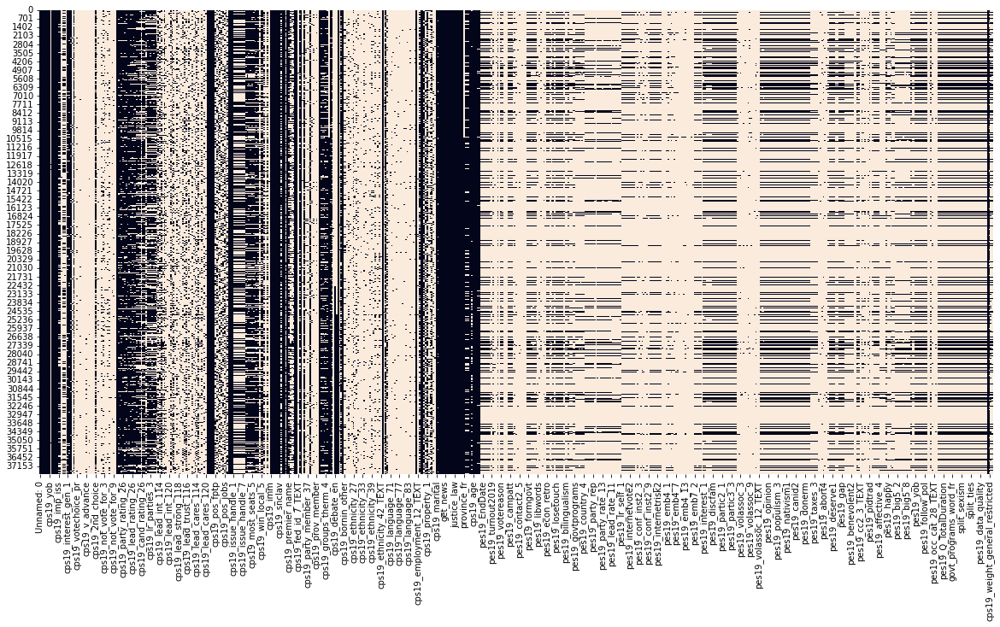

In [12]:
plt.figure(figsize=(20, 10))
sns.heatmap(df.isna(), cbar=False)

In [13]:
(df.isna().sum()/df.shape[0]).sort_values()

Unnamed: 0                         0.000000
cps19_bornin_canada                0.000000
cps19_religion                     0.000000
cps19_fed_donate                   0.000000
cps19_fed_id                       0.000000
cps19_prov_gov_sat                 0.000000
cps19_own_fin_retro                0.000000
cps19_duty_choice                  0.000000
cps19_volunteer                    0.000000
cps19_lib_promises                 0.000000
cps19_pol_eth                      0.000000
cps19_govt_say                     0.000000
cps19_govt_confusing               0.000000
cps19_refugees                     0.000000
cps19_imm                          0.000000
cps19_ownfinanc_fed                0.000000
cps19_econ_fed                     0.000000
cps19_econ_retro                   0.000000
cps19_spend_imm_min                0.000000
cps19_spend_defence                0.000000
cps19_spend_just_law               0.000000
cps19_spend_env                    0.000000
cps19_sexuality                 

In [14]:
df = df[df.columns[df.isna().sum()/df.shape[0] < 0.70]]
print(df.shape)
df.head()

(37822, 168)


,Unnamed: 0,cps19_StartDate,cps19_EndDate,cps19_ResponseId,cps19_consent,cps19_citizenship,cps19_yob,cps19_gender,cps19_province,cps19_education,cps19_demsat,cps19_imp_iss,cps19_imp_iss_party,cps19_imp_loc_iss,cps19_imp_loc_iss_p,cps19_interest_gen_1,cps19_interest_elxn_1,cps19_v_likely,cps19_votechoice,cps19_2nd_choice,cps19_fed_gov_sat,cps19_party_rating_23,cps19_party_rating_24,cps19_party_rating_25,cps19_party_rating_26,cps19_party_rating_27,cps19_party_rating_28,cps19_lead_rating_23,cps19_lead_rating_24,cps19_lead_rating_25,cps19_lead_rating_26,cps19_lead_rating_27,cps19_lead_rating_28,cps19_cand_rating_23,cps19_cand_rating_24,cps19_cand_rating_25,cps19_cand_rating_27,cps19_cand_rating_28,cps19_lr_scale_bef_1,cps19_lr_parties_1,cps19_lr_parties_2,cps19_lr_parties_3,cps19_lr_parties_4,cps19_lr_parties_5,cps19_lr_parties_6,cps19_lr_scale_aft_1,cps19_lead_int_113,cps19_lead_int_114,cps19_lead_int_115,cps19_lead_int_117,cps19_lead_strong_113,cps19_lead_strong_115,cps19_lead_trust_115,cps19_lead_cares_115,cps19_spend_educ,cps19_spend_env,cps19_spend_just_law,cps19_spend_defence,cps19_spend_imm_min,cps19_pos_fptp,cps19_pos_life,cps19_pos_cannabis,cps19_pos_carbon,cps19_pos_energy,cps19_pos_envreg,cps19_pos_jobs,cps19_pos_subsid,cps19_pos_trade,cps19_econ_retro,cps19_econ_fed,cps19_ownfinanc_fed,cps19_issue_handle_1,cps19_issue_handle_2,cps19_issue_handle_3,cps19_issue_handle_4,cps19_issue_handle_5,cps19_issue_handle_6,cps19_issue_handle_7,cps19_issue_handle_8,cps19_most_seats_1,cps19_most_seats_2,cps19_most_seats_3,cps19_most_seats_4,cps19_most_seats_5,cps19_most_seats_6,cps19_win_local_1,cps19_win_local_2,cps19_win_local_3,cps19_win_local_5,cps19_win_local_6,cps19_outcome_most,cps19_outcome_least,cps19_imm,cps19_refugees,cps19_govt_confusing,cps19_govt_say,cps19_pol_eth,cps19_lib_promises,cps19_snclav,cps19_news_cons,cps19_volunteer,cps19_duty_choice,cps19_own_fin_retro,cps19_premier_name,cps19_finmin_name,cps19_presrus_name,cps19_prov_gov_sat,cps19_fed_id,cps19_fed_id_str,cps19_prov_id,cps19_prov_id_str,cps19_party_member_39,cps19_fed_donate,cps19_groups_therm_1,cps19_groups_therm_2,cps19_groups_therm_3,cps19_groups_therm_4,cps19_groups_therm_5,cps19_spoil,cps19_turnout_2015,cps19_vote_2015,cps19_debate_en,cps19_debate_fr,cps19_religion,cps19_rel_imp,cps19_bornin_canada,cps19_sexuality,cps19_language_68,cps19_language_69,cps19_employment,cps19_sector,cps19_union,cps19_children,cps19_income_number,cps19_income_cat,cps19_property_1,cps19_property_4,cps19_marital,cps19_household,cps19_current_date,cps19_current_date_string,cps19_Q_Language,cps19_Q_TotalDuration,get_news,get_more_naming,get_not_vote_for,get_party_issue_handling,get_imp_loc_iss,get_outcome,justice_law,justice_law_fr,lr_scale_order,ethnicity_intro,ethnicity_intro_fr,premier,province_fr,pid_en,pid_party_en,pid_party_fr,cps19_data_quality,cps19_panel,cps19_age,cps19_duplicates_flag,cps19_inattentive,constituencynumber,constituencyname,cps19_weight_general_all,cps19_weight_general_restricted
0,1,2019-09-13 04:09:44,2019-09-13 04:36:19,R_1OpYXEFGzHRUpjM,I consent to participate in this study. I have...,Canadian citizen,1989,A woman,Quebec,Master's degree,Fairly satisfied,environnement,Green Party,logement,ndp,9.0,9.0,Certain to vote,Green Party,Liberal Party,Not very satisfied,52.0,0.0,64.0,NaN,97.0,0.0,55.0,0.0,71.0,15.0,80.0,0.0,58.0,0.0,69.0,76.0,0.0,NaN,5.0,9.0,3.0,5.0,2.0,10.0,2.0,Justin Trudeau,NaN,Jagmeet Singh,Elizabeth May,Justin Trudeau,NaN,NaN,NaN,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,NaN,NaN,NaN,Strongly agree,NaN,Strongly agree,Strongly disagree,NaN,NaN,Stayed about the same,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0,54.0,46.0,0.0,50.0,0.0,NaN,NaN,57.0,NaN,NaN,NaN,NaN,More immigrants,More refugees,Don't know/ Prefer not to answer,Don't know/ Prefer not to answer,Don't know

<AxesSubplot:>

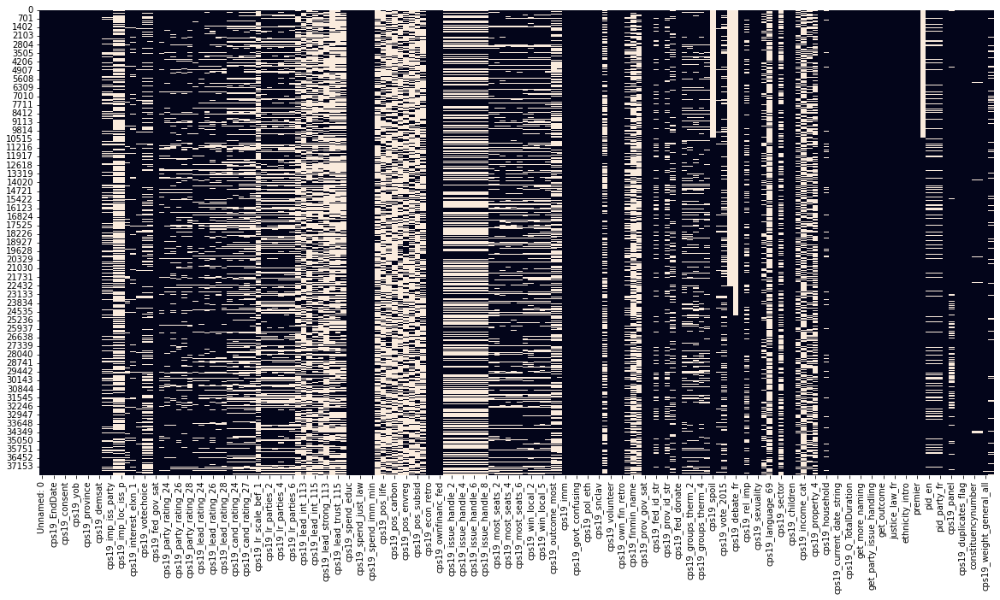

In [15]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [30]:
df.drop(["Unnamed: 0", "cps19_StartDate", "cps19_EndDate", "cps19_ResponseId", "cps19_consent"], axis=1, inplace=True)

<AxesSubplot:>

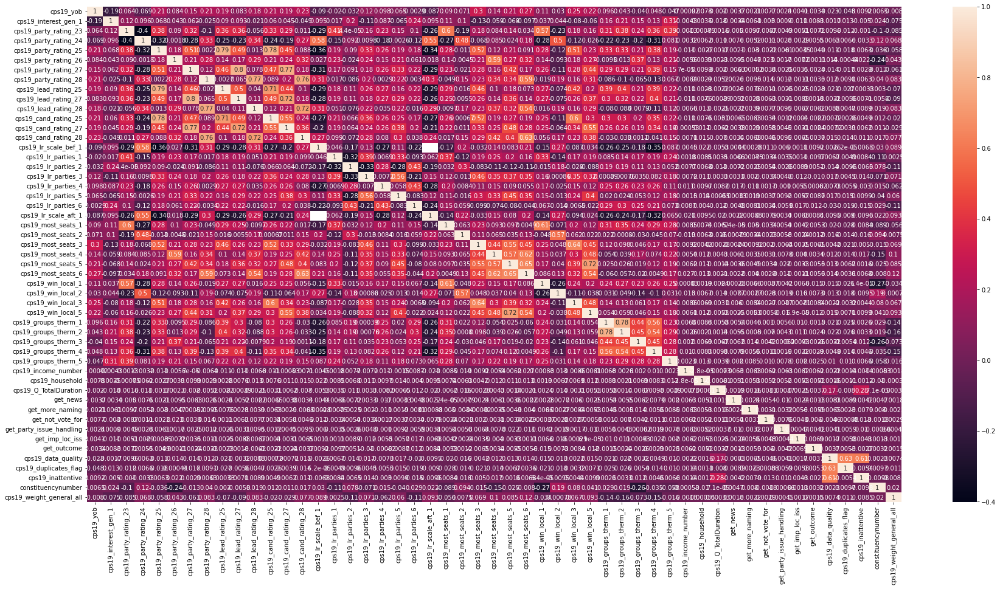

In [31]:
plt.figure(figsize=(30, 15))
sns.heatmap(df.corr(), annot=True)

In [32]:
corr_matrix = df.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

df.drop([column for column in upper.columns if any(upper[column] > 0.80)], axis=1, inplace=True)

C:\Users\Kqn23\AppData\Local\Temp\ipykernel_6344\346546172.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))


In [33]:
df.select_dtypes("float")

,cps19_interest_gen_1,cps19_party_rating_23,cps19_party_rating_24,cps19_party_rating_25,cps19_party_rating_26,cps19_party_rating_27,cps19_party_rating_28,cps19_lead_rating_25,cps19_lead_rating_27,cps19_lead_rating_28,cps19_cand_rating_25,cps19_cand_rating_27,cps19_cand_rating_28,cps19_lr_scale_bef_1,cps19_lr_parties_1,cps19_lr_parties_2,cps19_lr_parties_3,cps19_lr_parties_4,cps19_lr_parties_5,cps19_lr_parties_6,cps19_lr_scale_aft_1,cps19_most_seats_1,cps19_most_seats_2,cps19_most_seats_3,cps19_most_seats_4,cps19_most_seats_5,cps19_most_seats_6,cps19_win_local_1,cps19_win_local_2,cps19_win_local_3,cps19_win_local_5,cps19_groups_therm_1,cps19_groups_therm_2,cps19_groups_therm_3,cps19_groups_therm_4,cps19_groups_therm_5,cps19_income_number,cps19_household,constituencynumber,cps19_weight_general_all
0,9.0,52.0,0.0,64.0,NaN,97.0,0.0,71.0,80.0,0.0,69.0,76.0,0.0,NaN,5.0,9.0,3.0,5.0,2.0,10.0,2.0,59.0,54.0,46.0,0.0,50.0,0.0,NaN,NaN,57.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,24039.0,0.681336
1,6.0,51.0,0.0,64.0,40.0,88.0,0.0,NaN,59.0,0.0,64.0,88.0,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,2.0,54.0,NaN,57.0,NaN,55.0,NaN,NaN,NaN,70.0,NaN,100.0,100.0,100.0,100.0,61.0,NaN,2.0,24039.0,0.681336
2,8.0,52.0,49.0,NaN,NaN,NaN,NaN,63.0,56.0,20.0,NaN,NaN,NaN,4.0,3.0,7.0,4.0,NaN,4.0,9.0,NaN,86.0,79.0,62.0,19.0,32.0,45.0,NaN,NaN,NaN,NaN,75.0,75.0,73.0,69.0,74.0,NaN,5.0,35095.0,0.650459
3,8.0,30.0,85.0,0.0,0.0,0.0,30.0,0.0,0.0,10.0,0.0,0.0,0.0,7.0,5.0,7.0,2.0,5.0,4.0,9.0,NaN,60.0,70.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,80.0,80.0,80.0,10.0,80.0,NaN,6.0,35104.0,0.887253
4,8.0,20.0,62.0,51.0,20.0,50.0,20.0,NaN,60.0,30.0,NaN,NaN,NaN,4.0,4.0,7.0,NaN,8.0,1.0,7.0,NaN,80.0,65.0,75.0,20.0,0.0,20.0,90.0,0.0,80.0,0.0,90.0,80.0,70.0,70.0,70.0,56000.0,6.0,35104.0,1.653808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37817,7.0,83.0,16.0,64.0,70.0,69.0,40.0,75.0,62.0,0.0,56.0,61.0,41.0,NaN,4.0,9.0,2.0,2.0,3.0,7.0,2.0,40.0,84.0,21.0,0.0,0.0,0.0,81.0,28.0,17.0,0.0,79.0,70.0,88.0,75.0,46.0,NaN,1.0,24056.0,0.745574
37818,8.0,40.0,65.0,0.0,50.0,85.0,60.0,0.0,95.0,55.0,5.0,60.0,50.0,8.0,6.0,8.0,1.0,4.0,7.0,7.0,NaN,40.0,60.0,30.0,10.0,15.0,15.0,60.0,81.0,10.0,29.0,35.0,0.0,40.0,15.0,50.0,62000.0,1.0,35024.0,0.887253
37819,10.0,0.0,0.0,100.0,0.0,68.0,0.0,100.0,70.0,0.0,100.0,67.0,0.0,NaN,NaN,NaN,5.0,5.0,5.0,NaN,NaN,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,96.0,100.0,96.0,98.0,52.0,NaN,5.0,47008.0,0.689530
37820,8.0,70.0,0.0,99.0,1.0,72.0,1.0,100.0,75.0,0.0,59.0,53.0,4.0,3.0,3.0,10.0,1.0,6.0,2.0,5.0,NaN,55.0,51.0,27.0,4.0,9.0,4.0,72.0,44.0,38.0,37.0,31.0,29.0,41.0,NaN,29.0,50000.0,2.0,35113.0,1.254407


C:\Users\Kqn23\AppData\Local\Temp\ipykernel_6344\3001310984.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


ValueError: Maximum allowed size exceeded

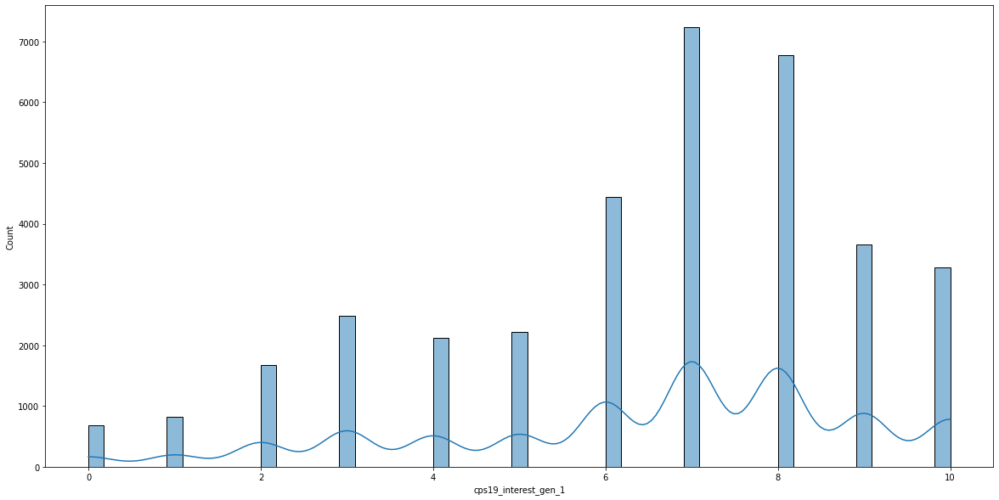

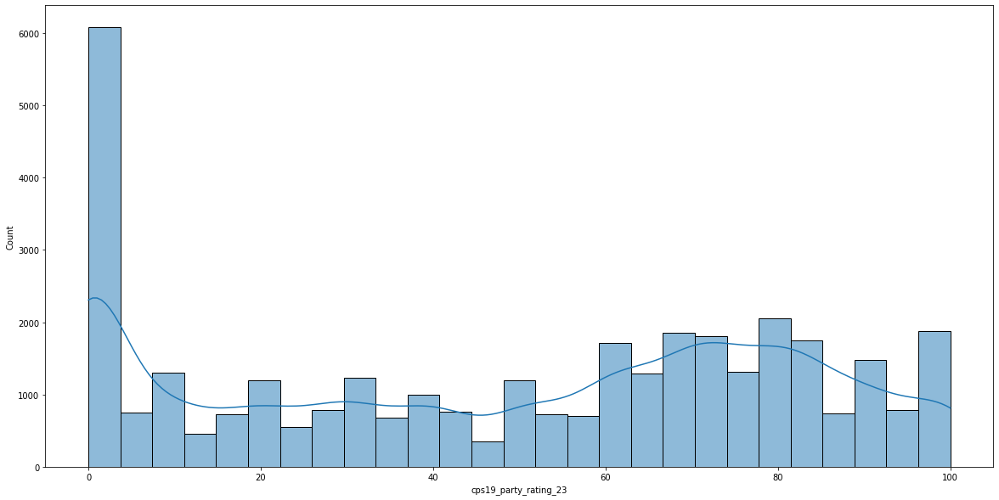

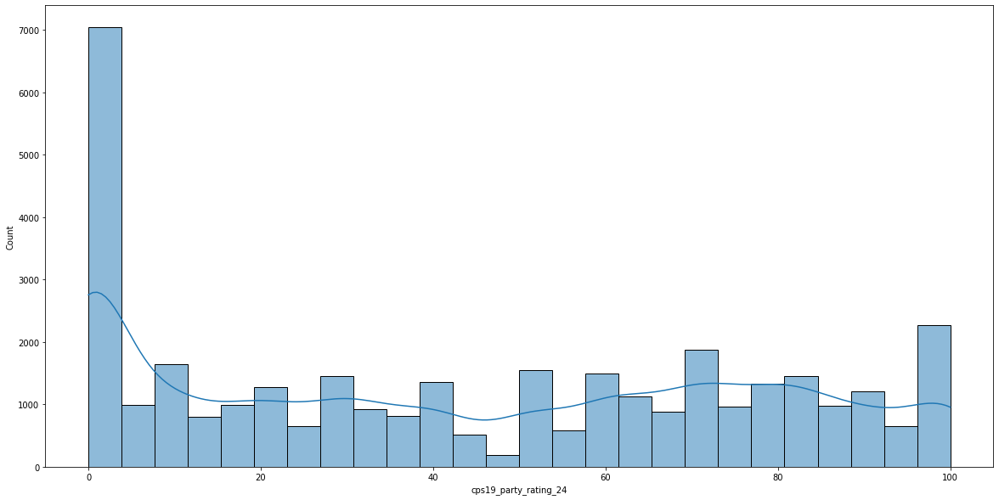

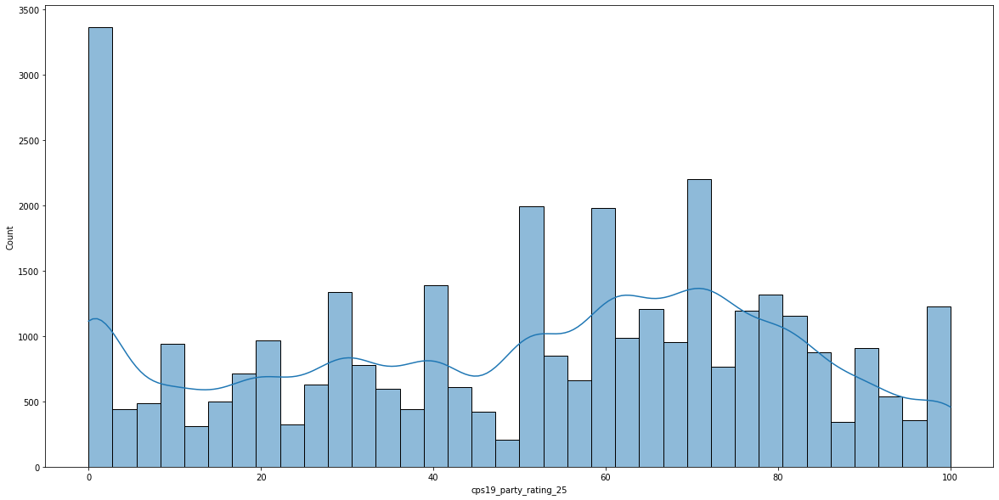

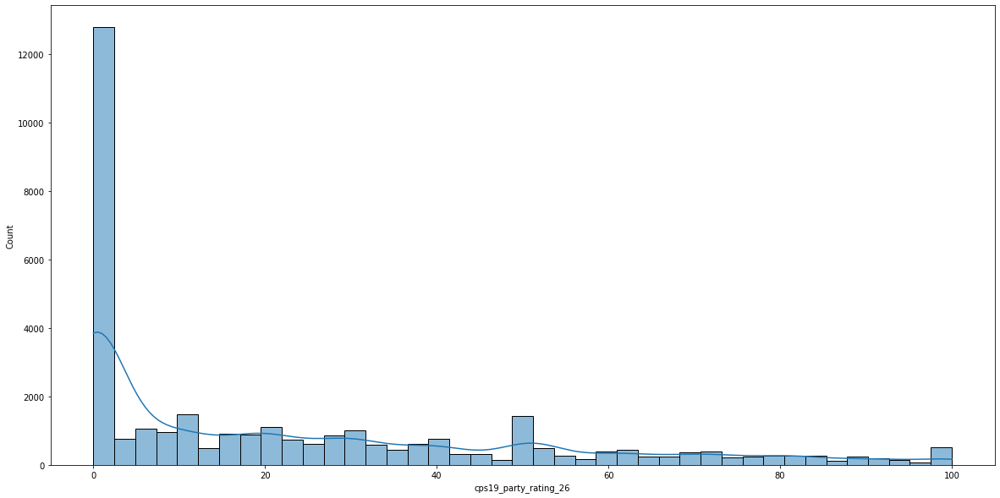

...

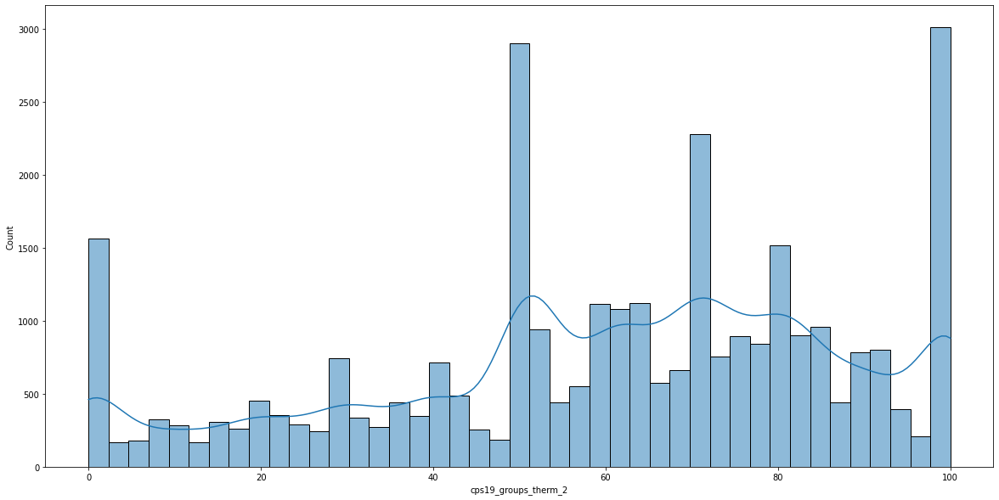

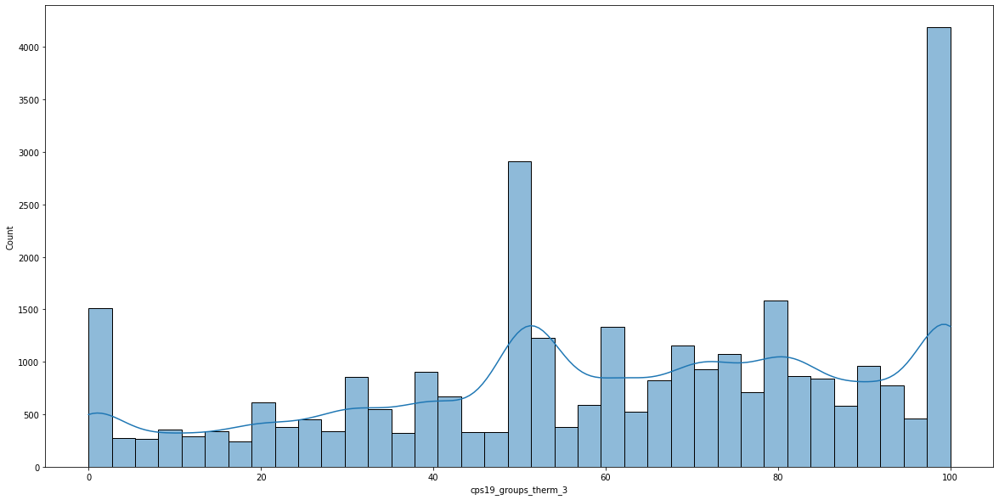

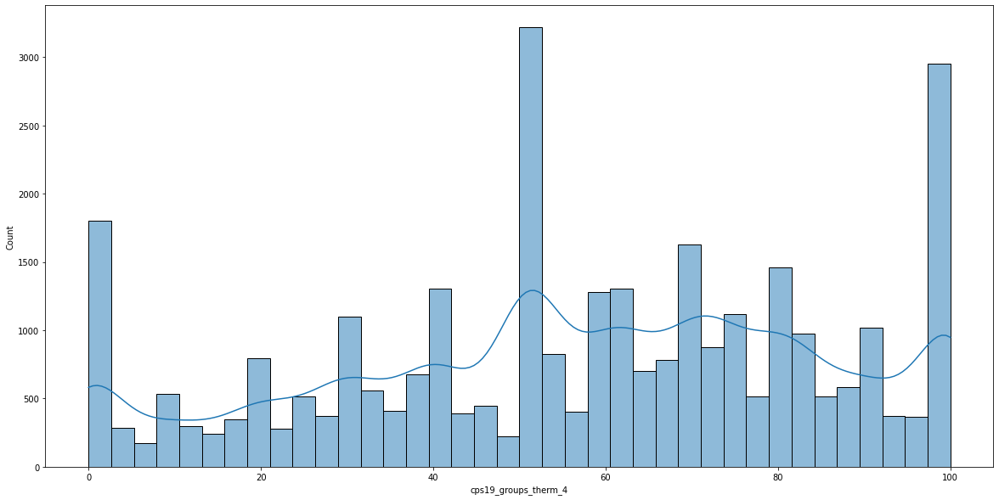

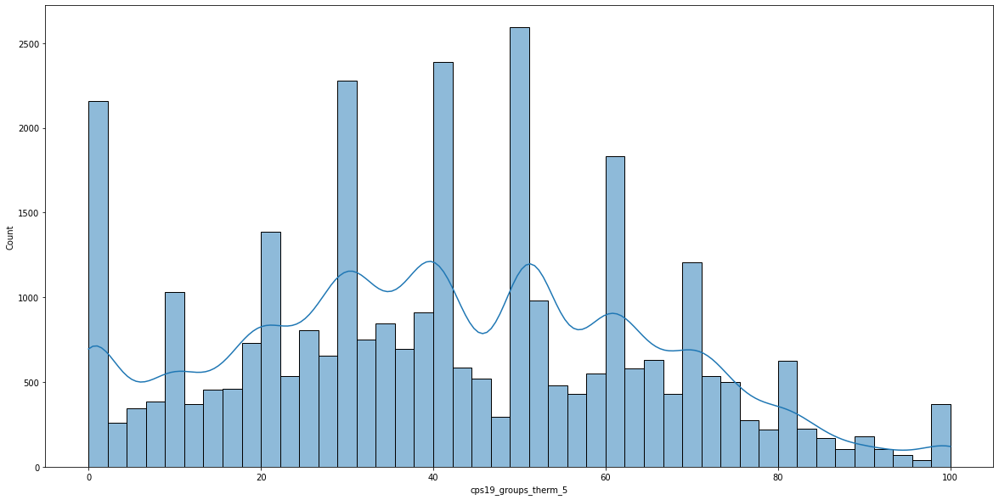

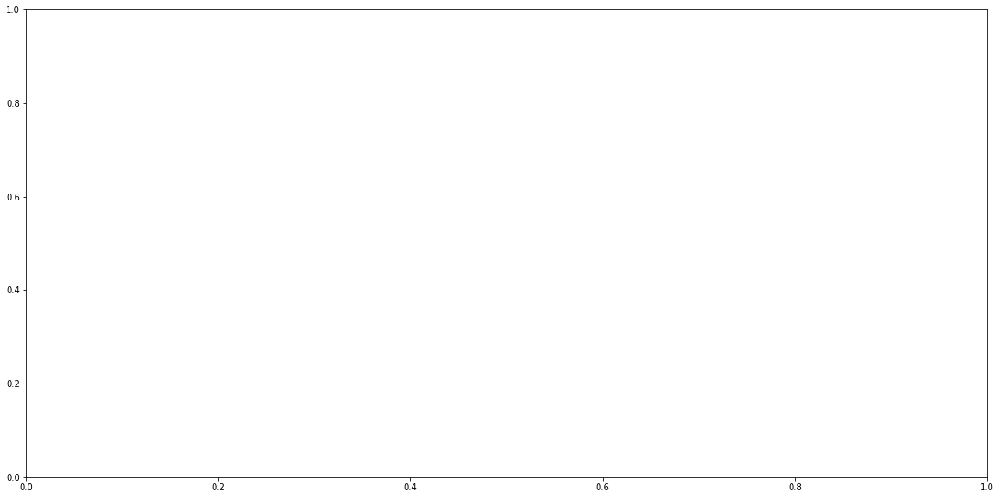

In [35]:
for col in df.select_dtypes("float"):
    plt.figure(figsize=(20, 10))
    sns.histplot(df[col], kde=True)

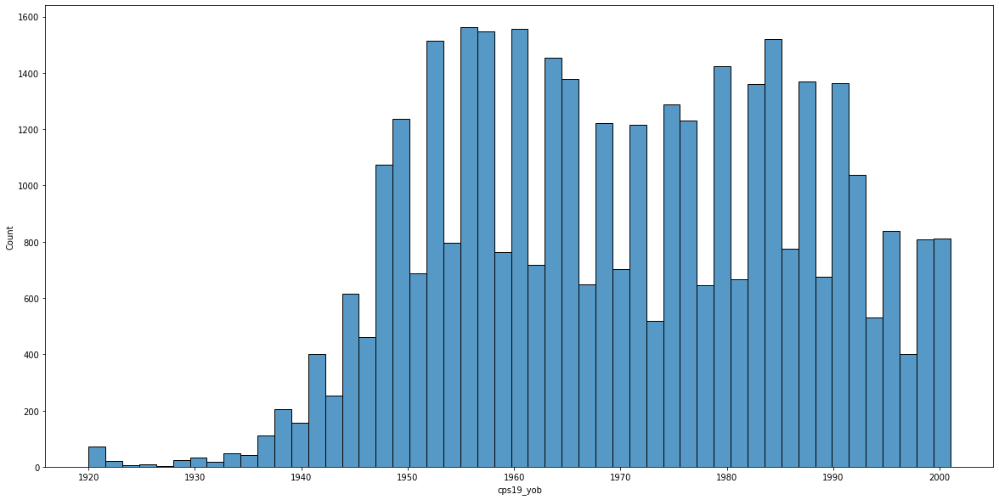

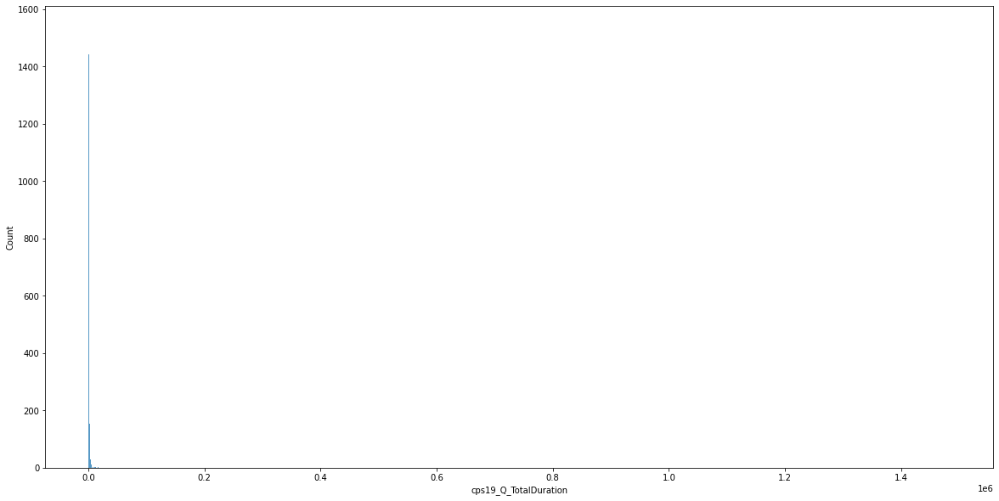

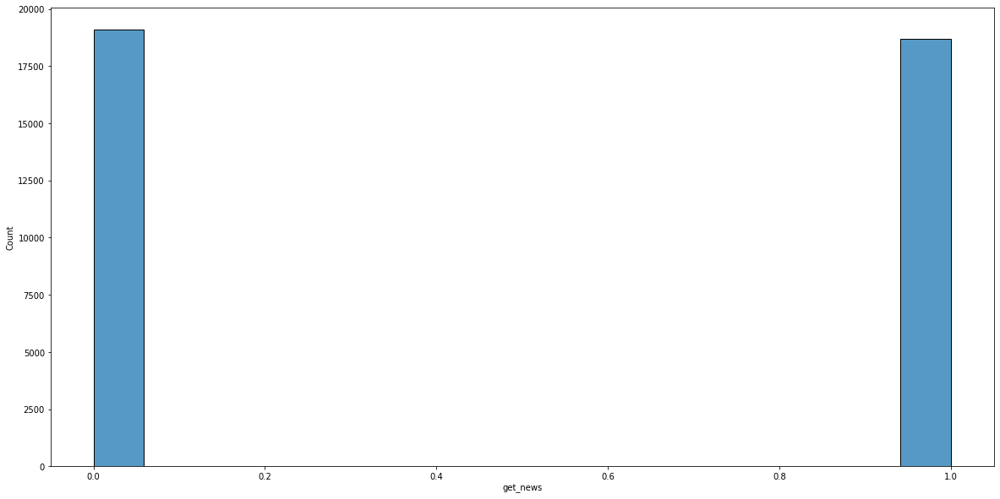

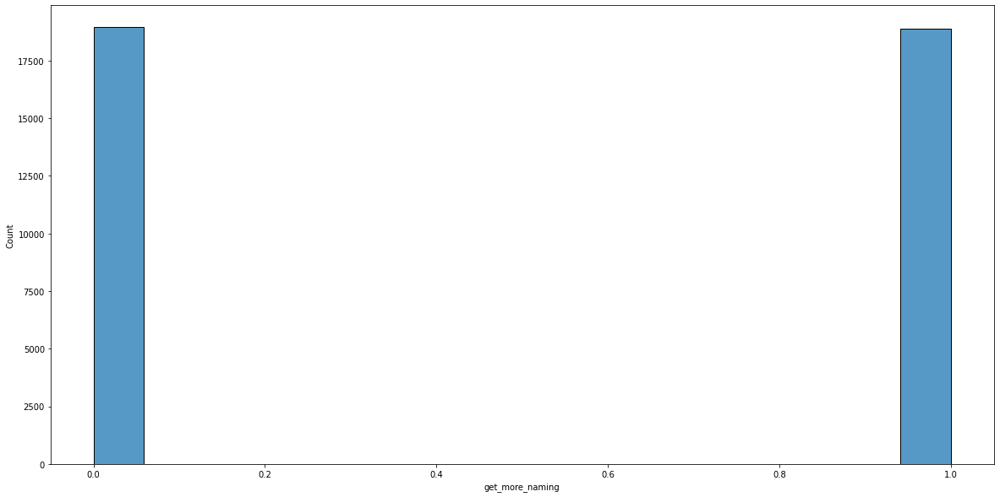

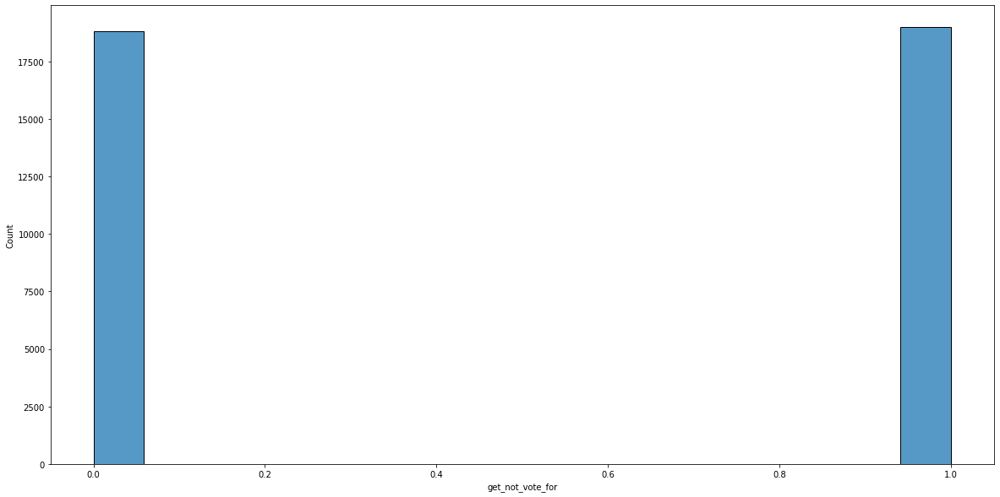

...

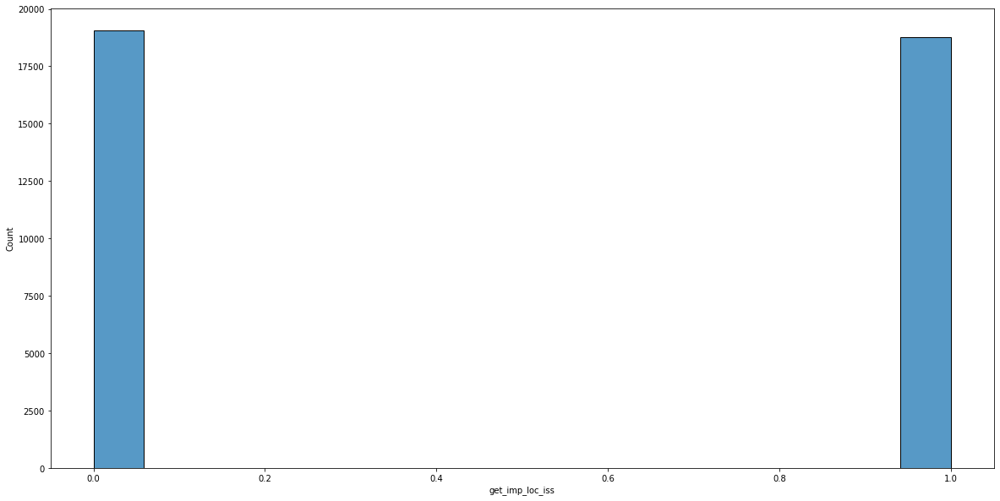

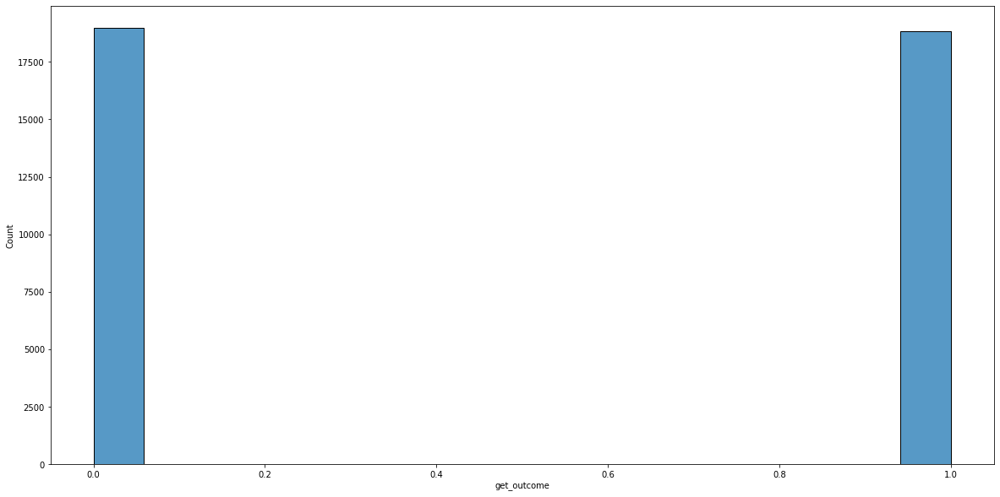

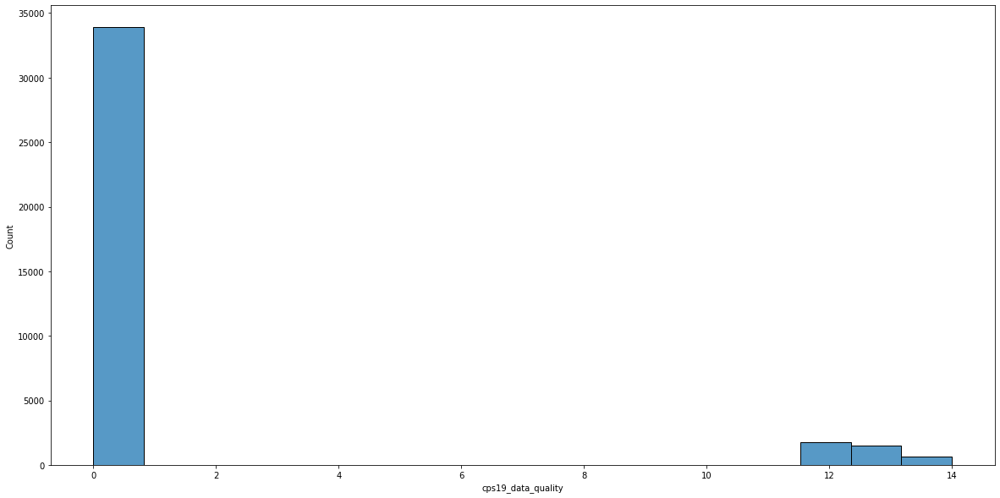

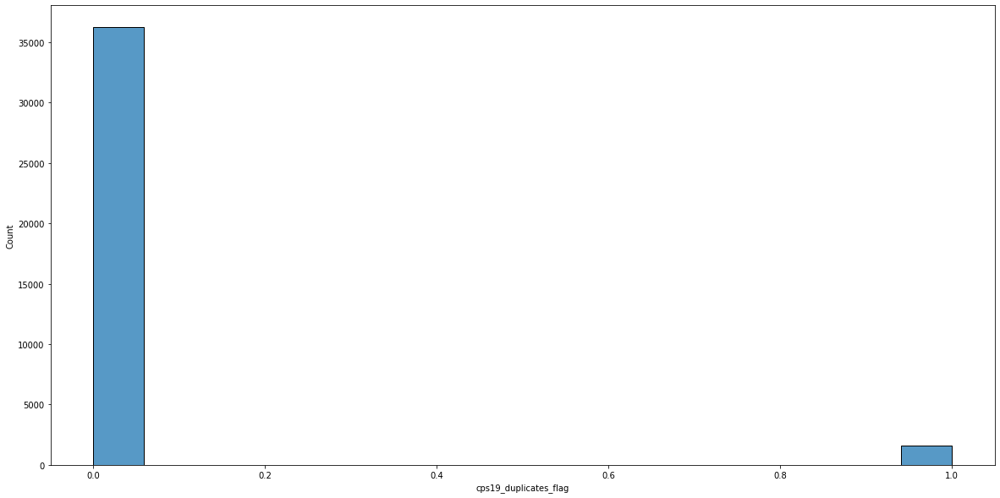

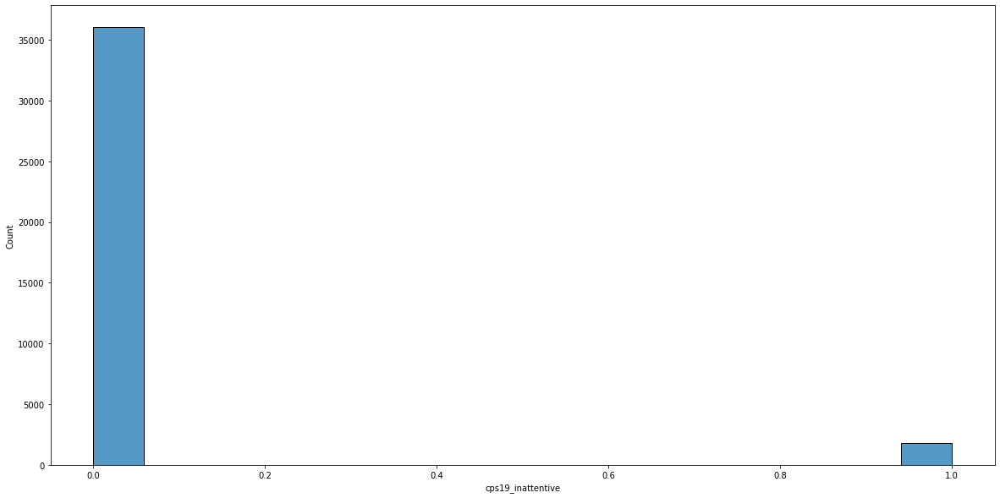

In [36]:
for col in df.select_dtypes("int"):
    plt.figure(figsize=(20, 10))
    sns.histplot(df[col])

In [ ]:
for col in df.select_dtypes("object"):
    print(f"{col :-<50} {df[col].unique()}")

C:\Users\Kqn23\AppData\Local\Temp\ipykernel_6344\440181565.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


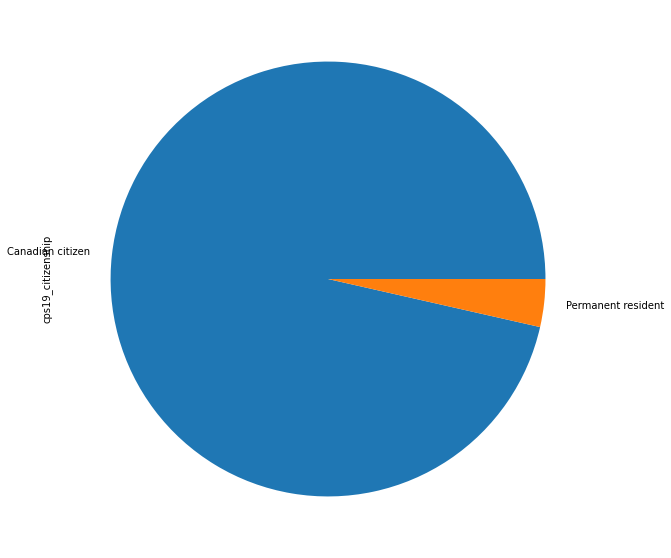

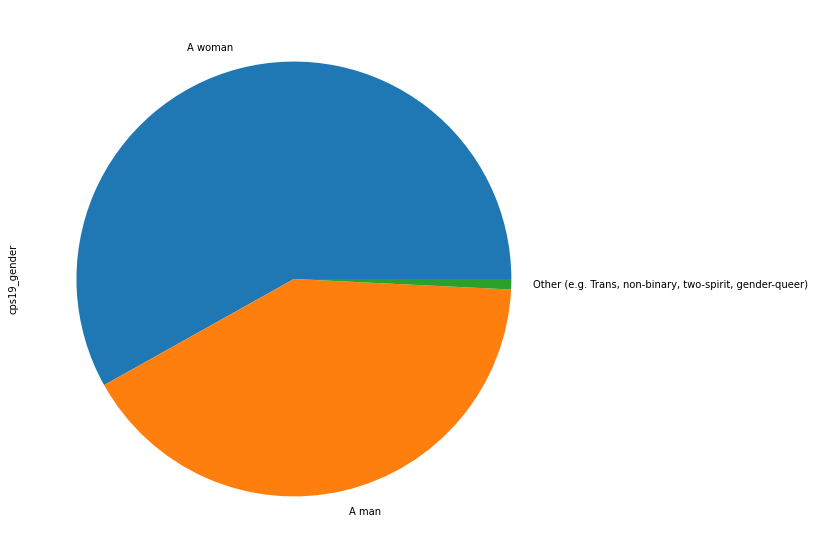

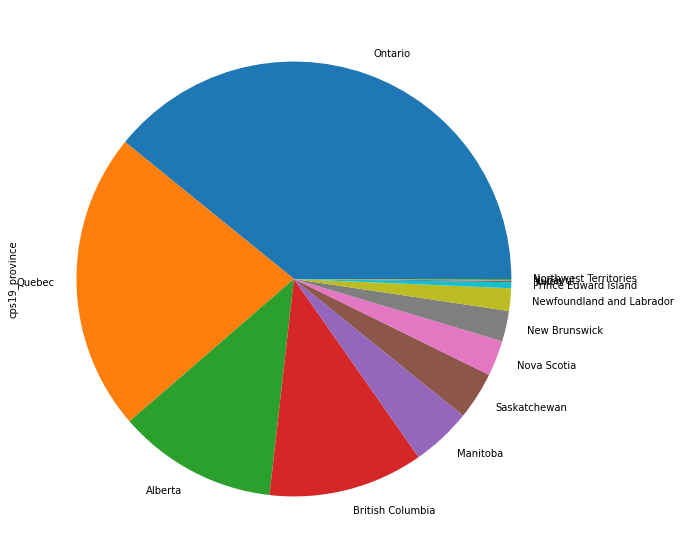

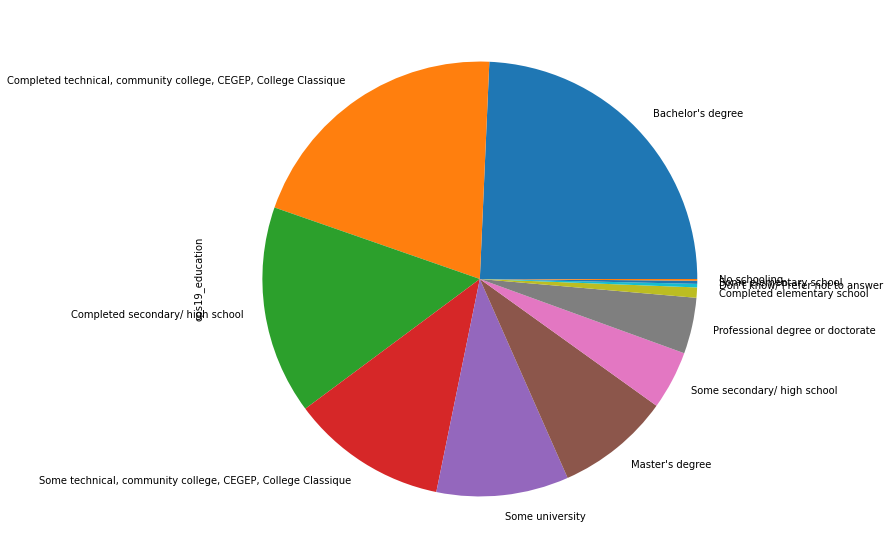

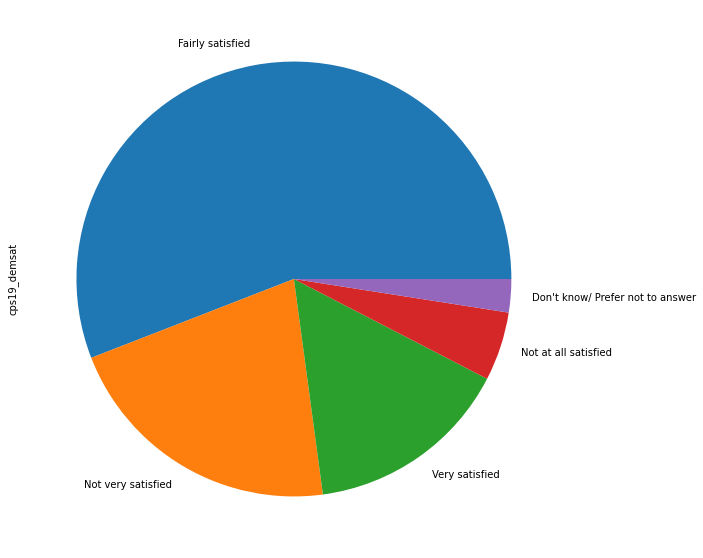

ValueError: 
The amount of $$ spent on refugees, imigrants etc. The amount of money they receive in benifits and yet those of us that have been here for life are geting taxed to death and many live on the edge especially in a time where most get little or no income increases.
              ^
Expected end of text, found '$'  (at char 14), (line:1, col:15)

<Figure size 1440x720 with 1 Axes>

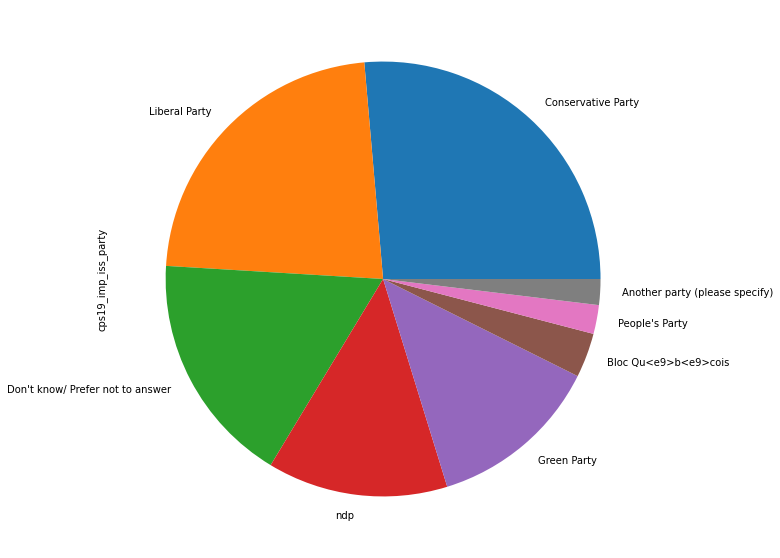

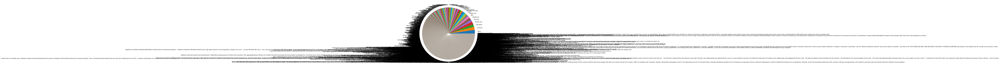

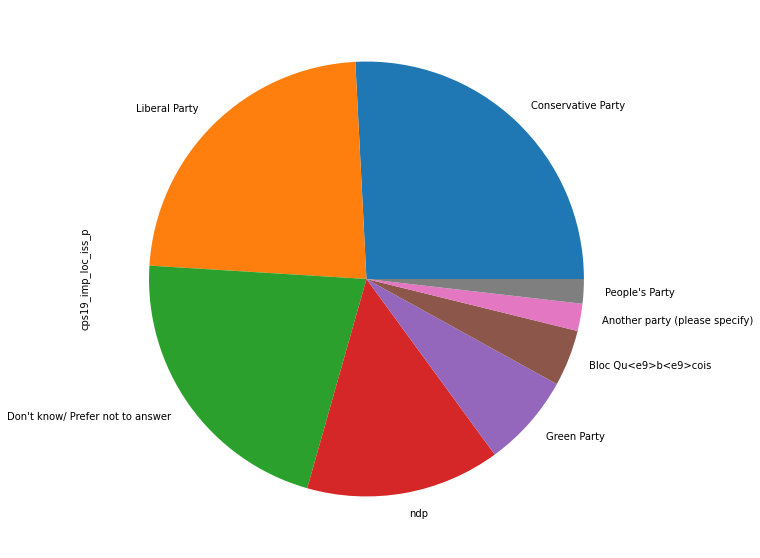

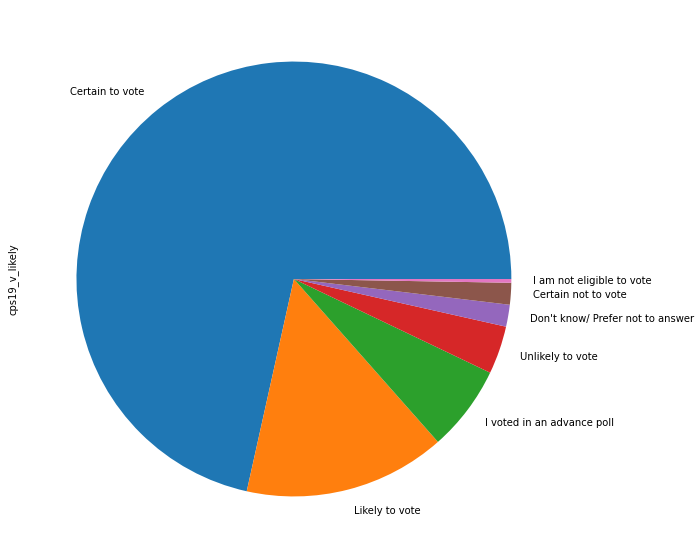

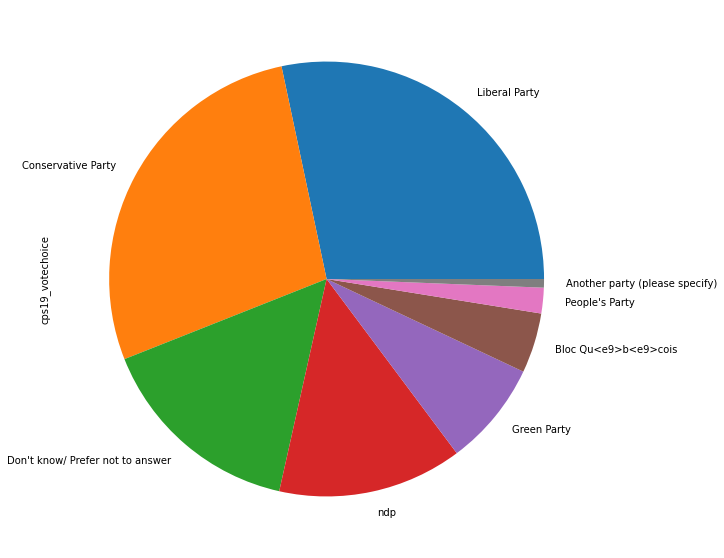

...

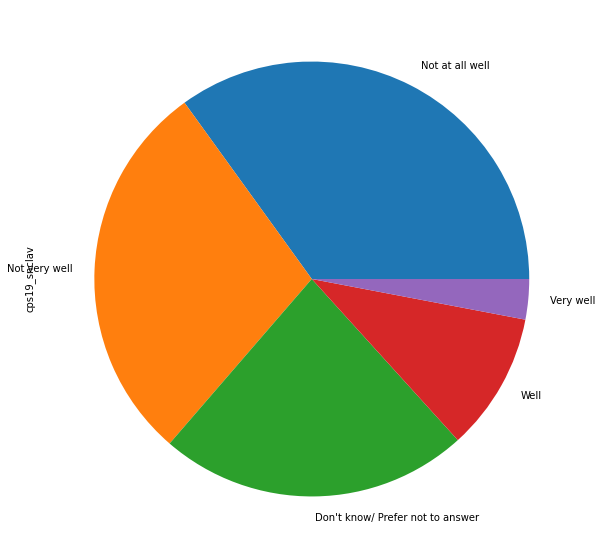

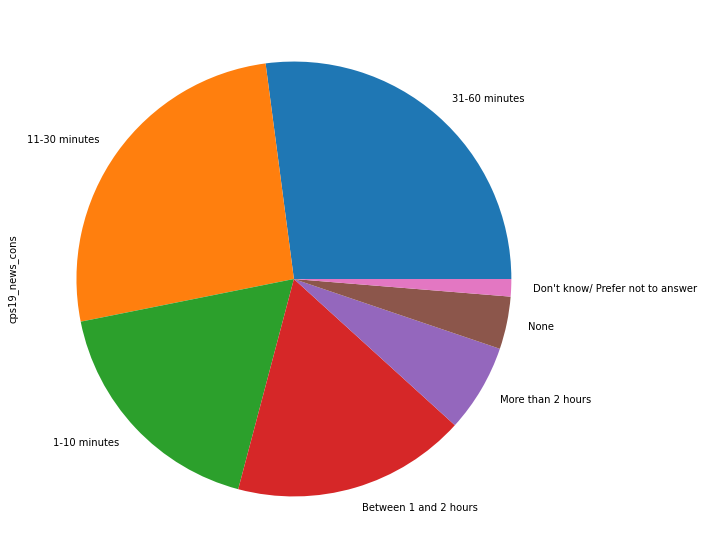

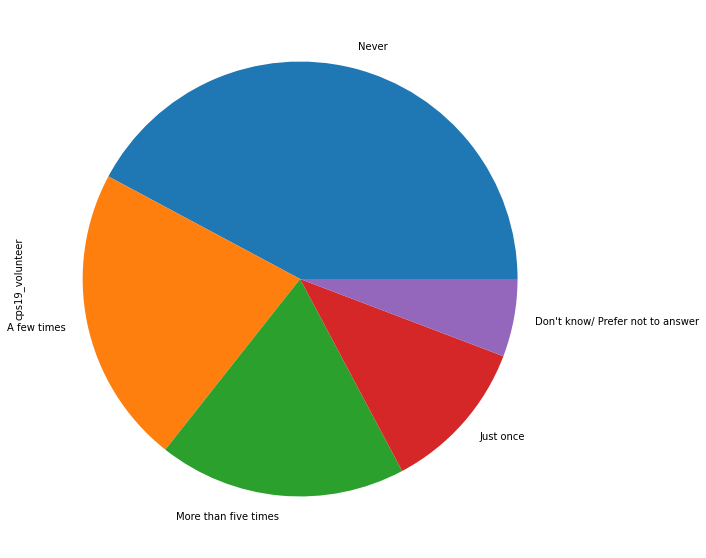

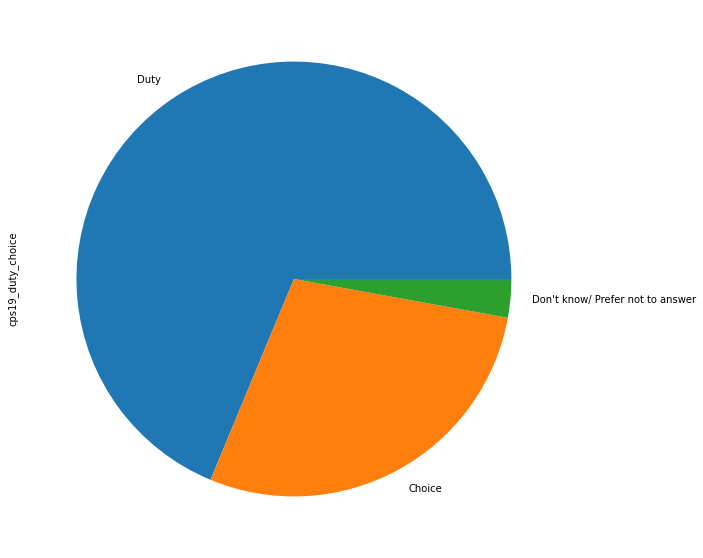

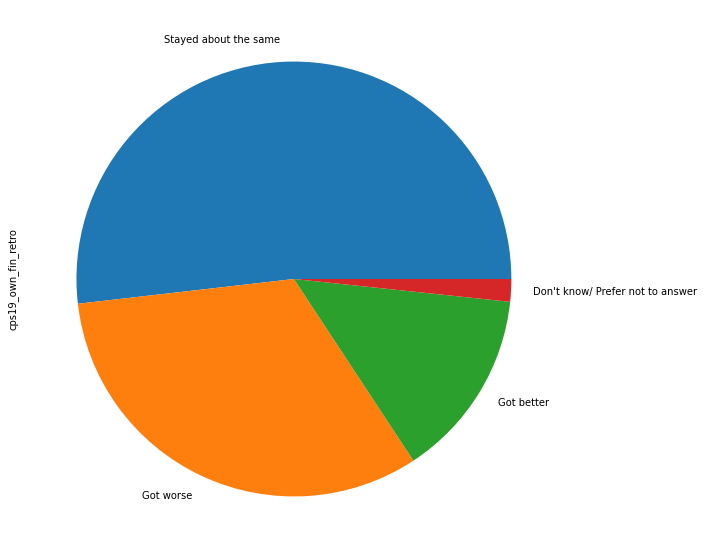

ValueError: 
Oui. Fran<e7>ois Legault ?$#%@%#$&
                          ^
Expected end of text, found '$'  (at char 26), (line:1, col:27)

<Figure size 1440x720 with 1 Axes>

C:\Users\Kqn23\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


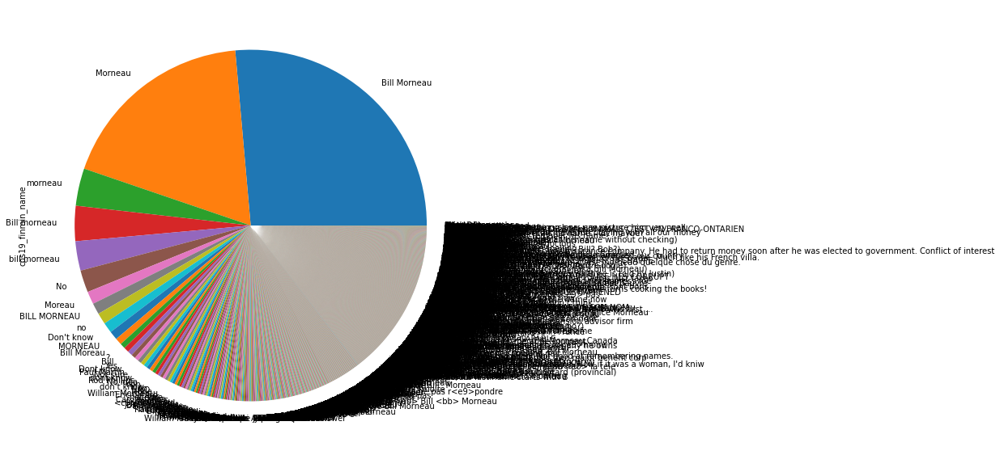

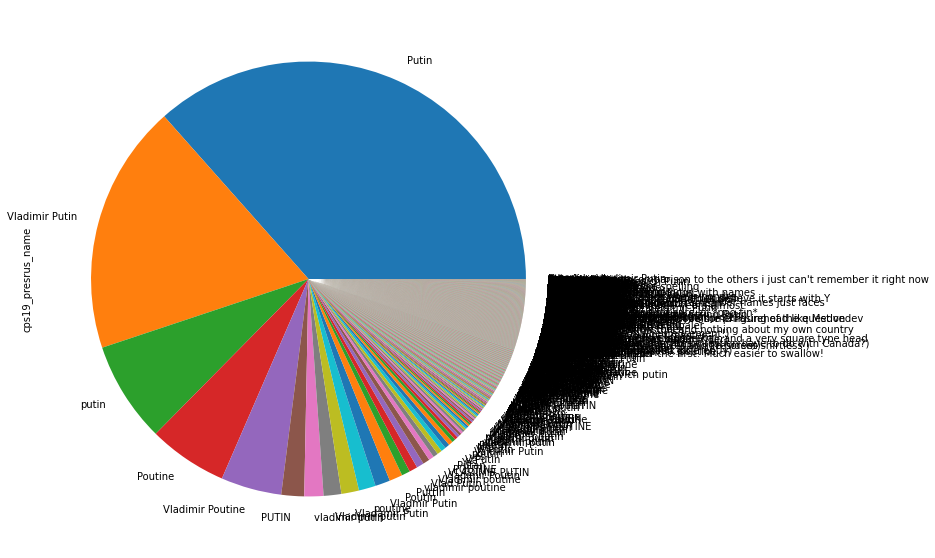

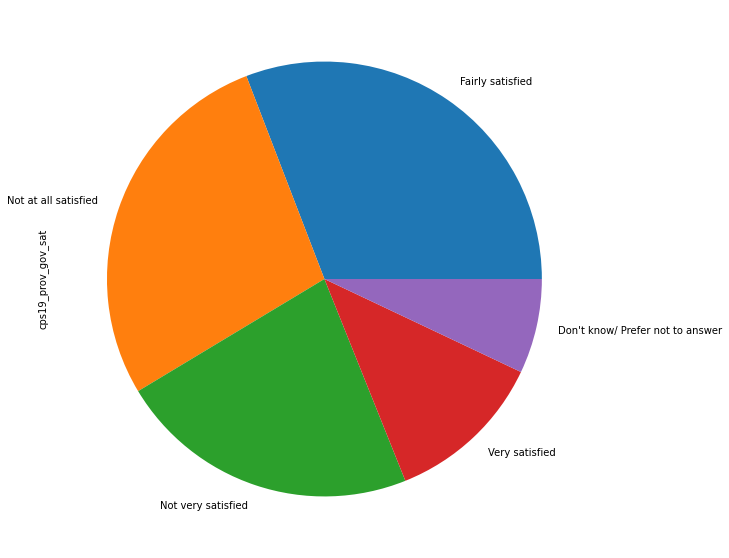

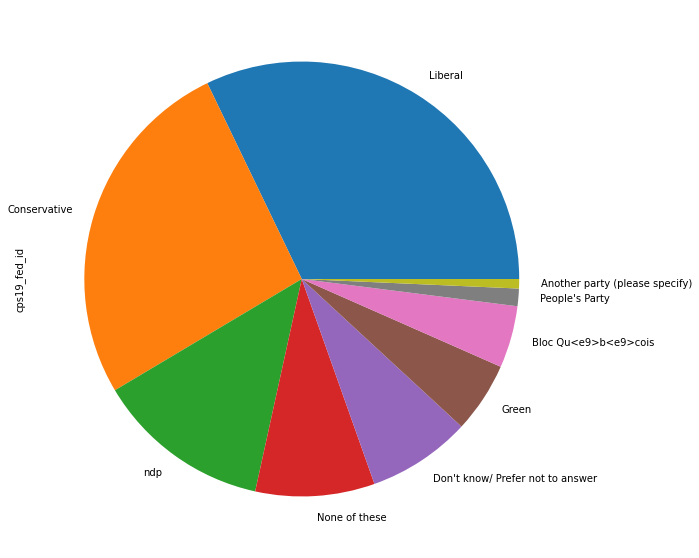

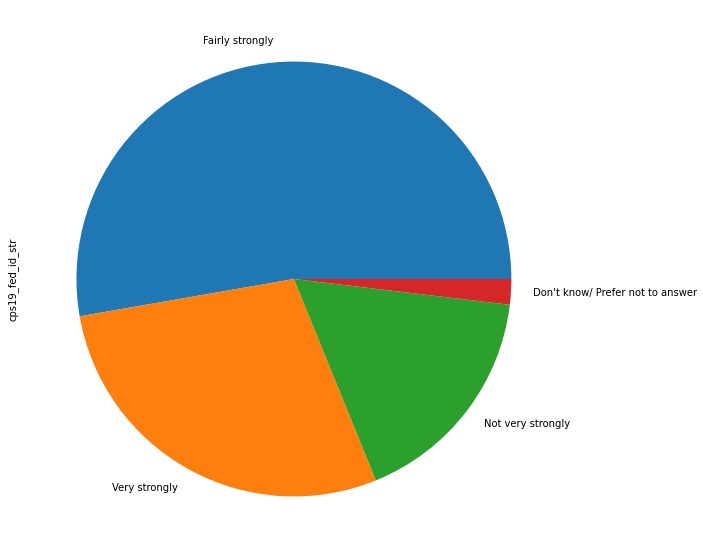

...

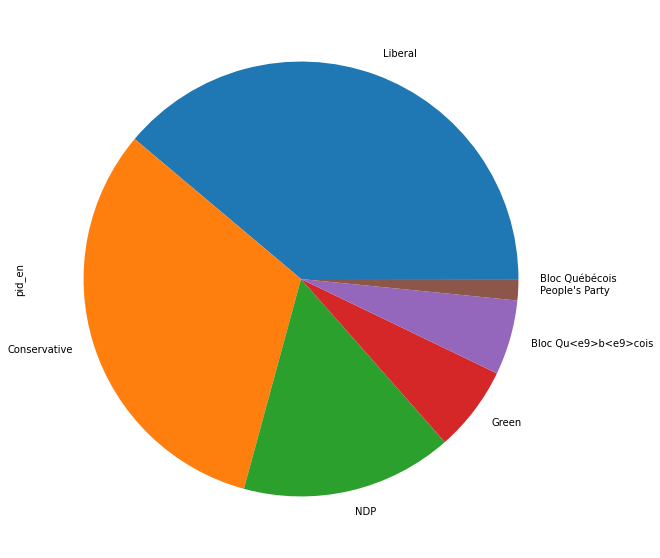

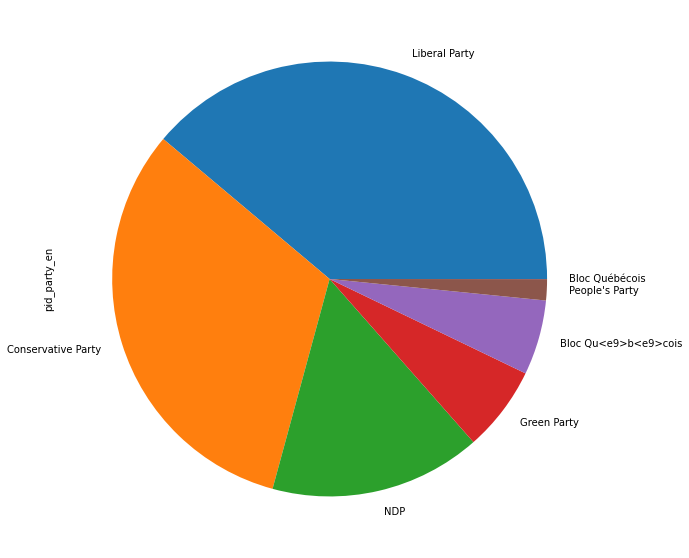

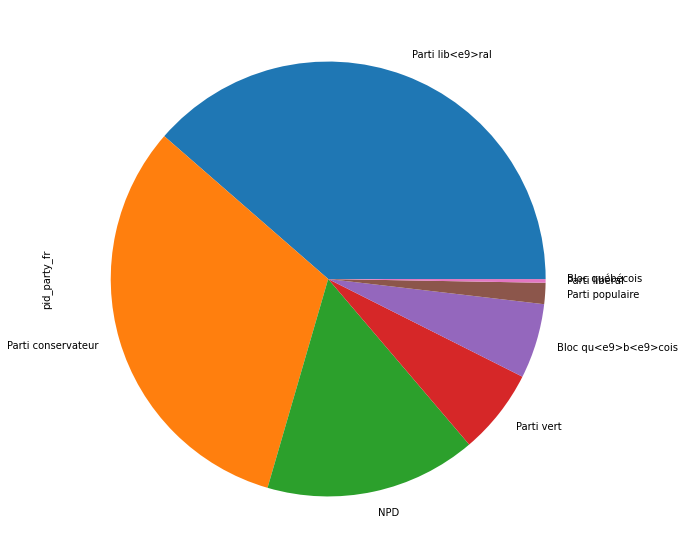

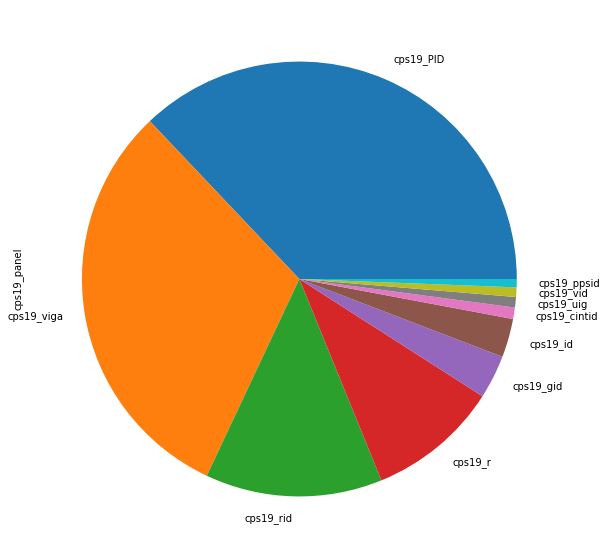

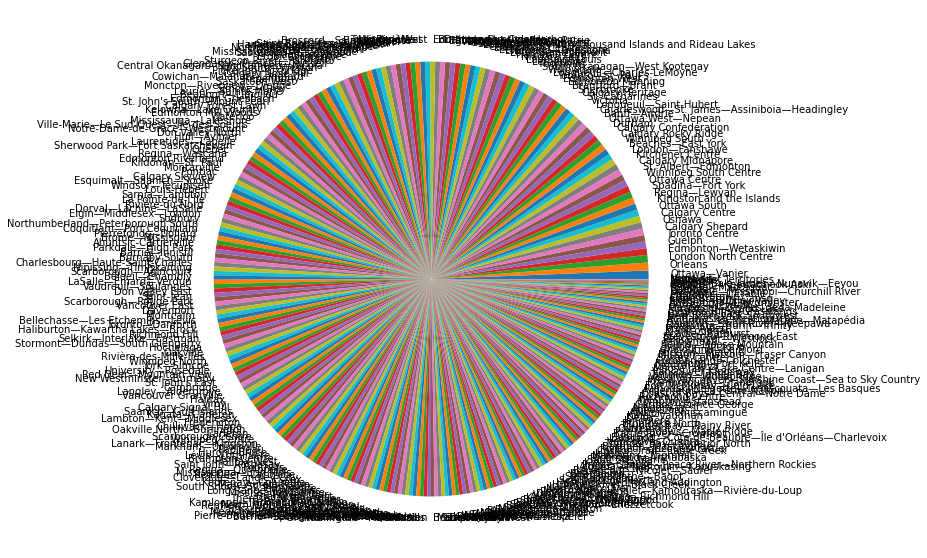

In [37]:
for col in df.select_dtypes('object'):
    plt.figure(figsize=(20, 10))
    df[col].value_counts().plot.pie()

In [42]:
my_columns

['cps19_employment',
 'cps19_bornin_canada',
 'cps19_imp_iss',
 'cps19_imp_iss_party',
 'cps19_2nd_choice',
 'cps19_religion']

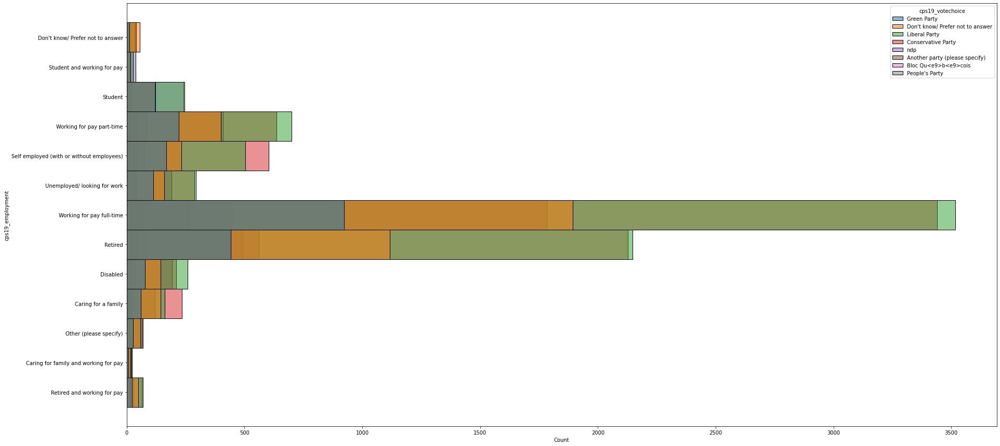

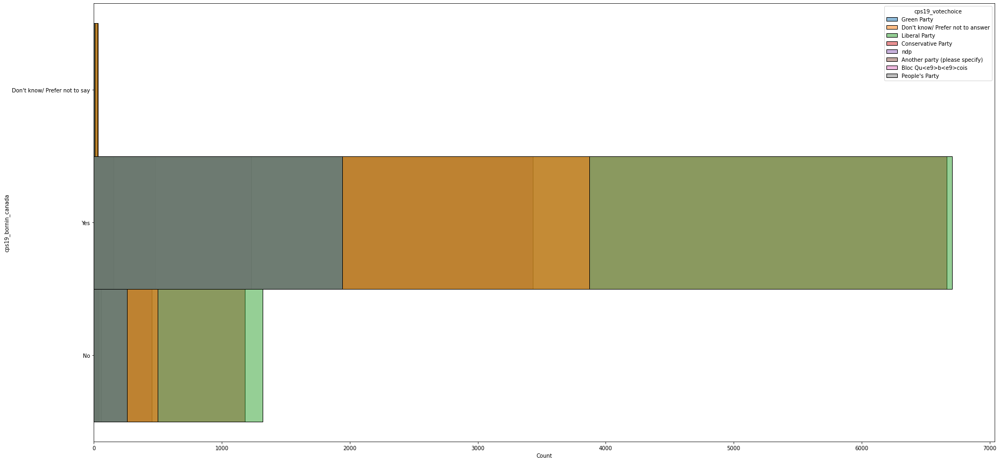

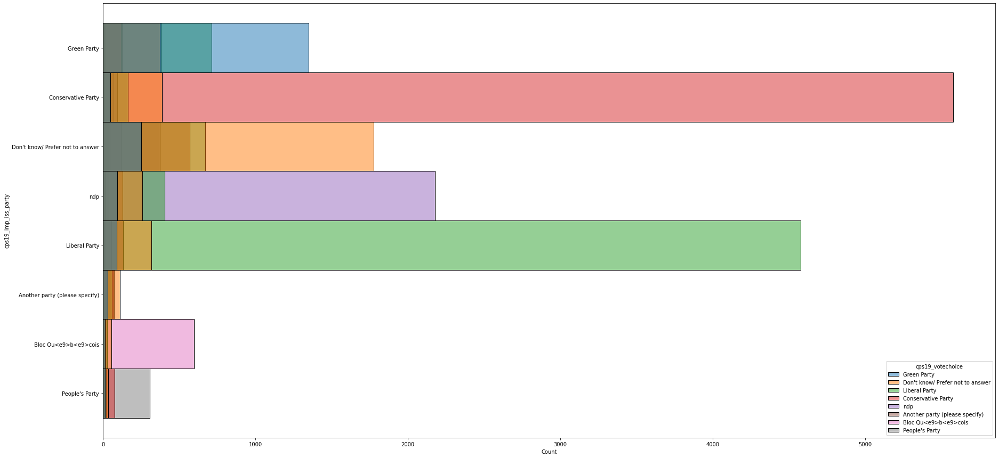

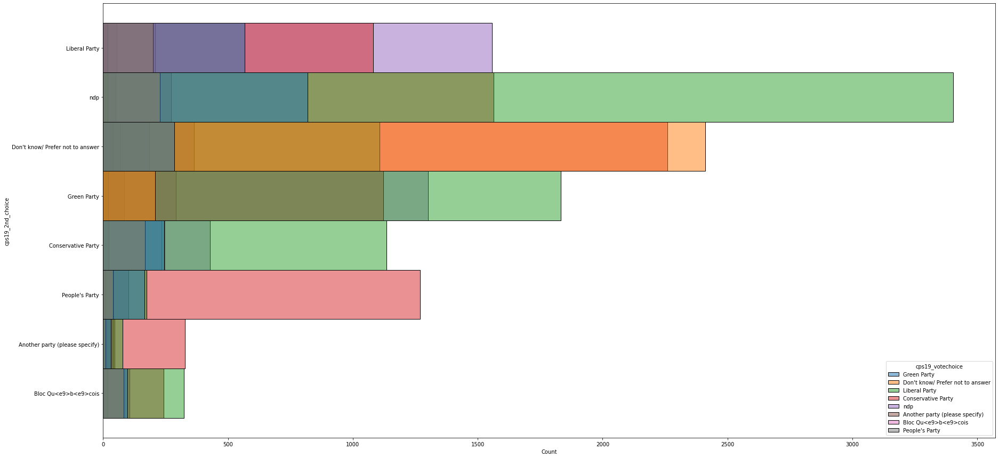

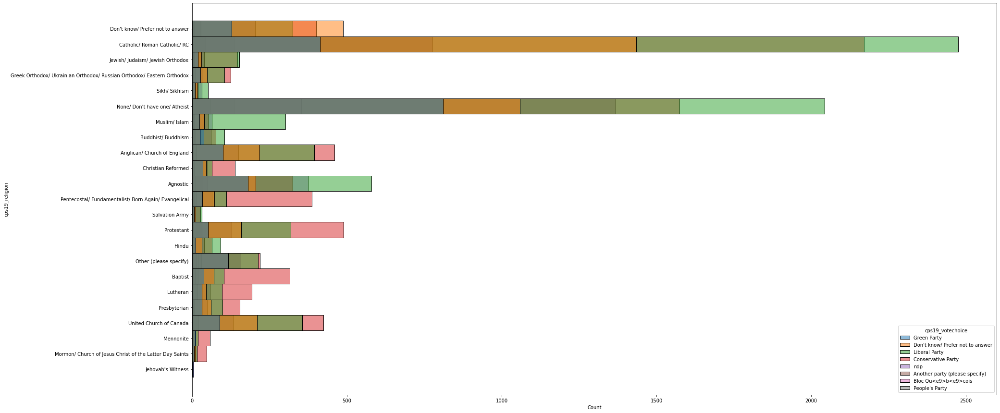

In [56]:
for col in my_columns:
    if col != "cps19_imp_iss":
        plt.figure(figsize=(30, 15))
        sns.histplot(data=df, y=col, hue="cps19_votechoice")

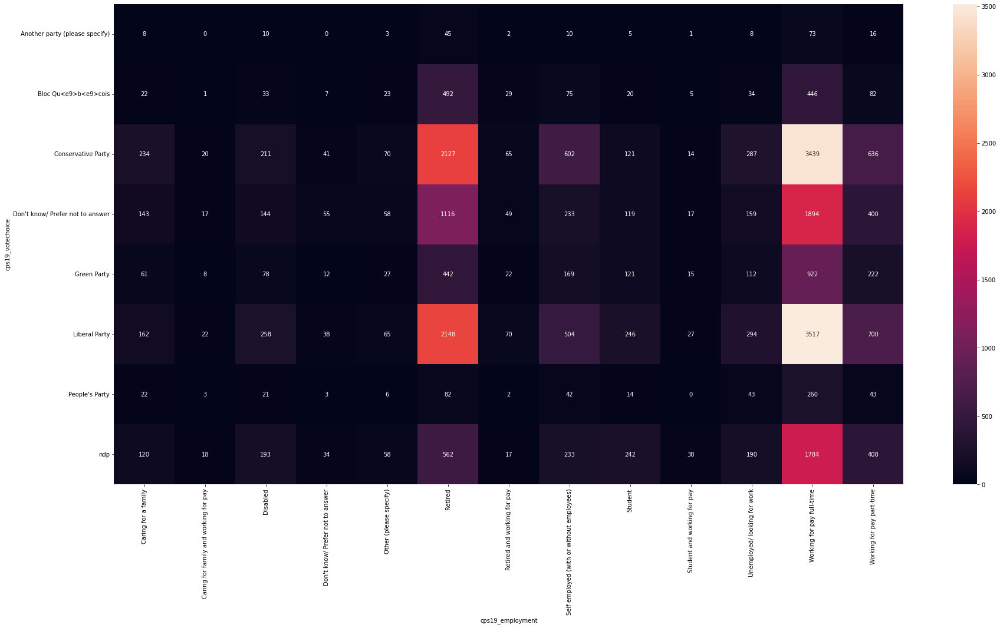

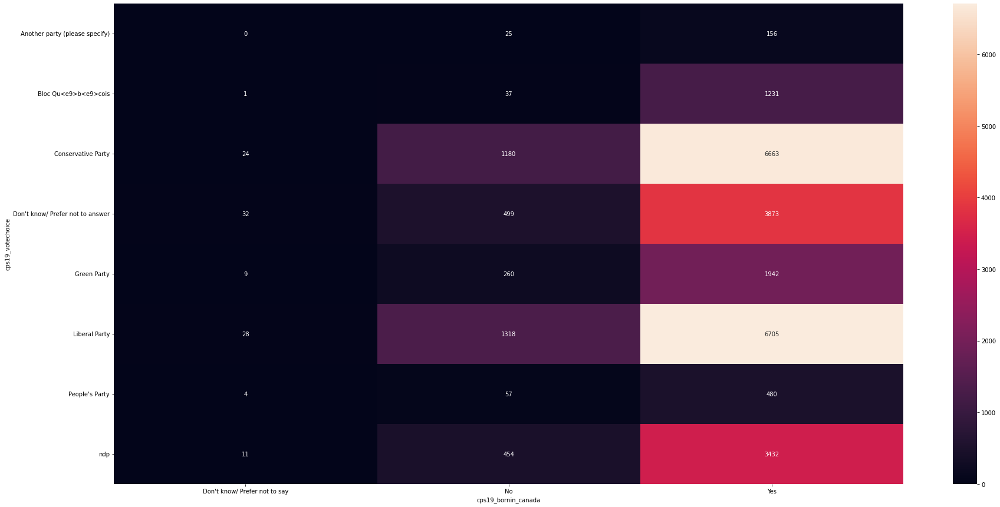

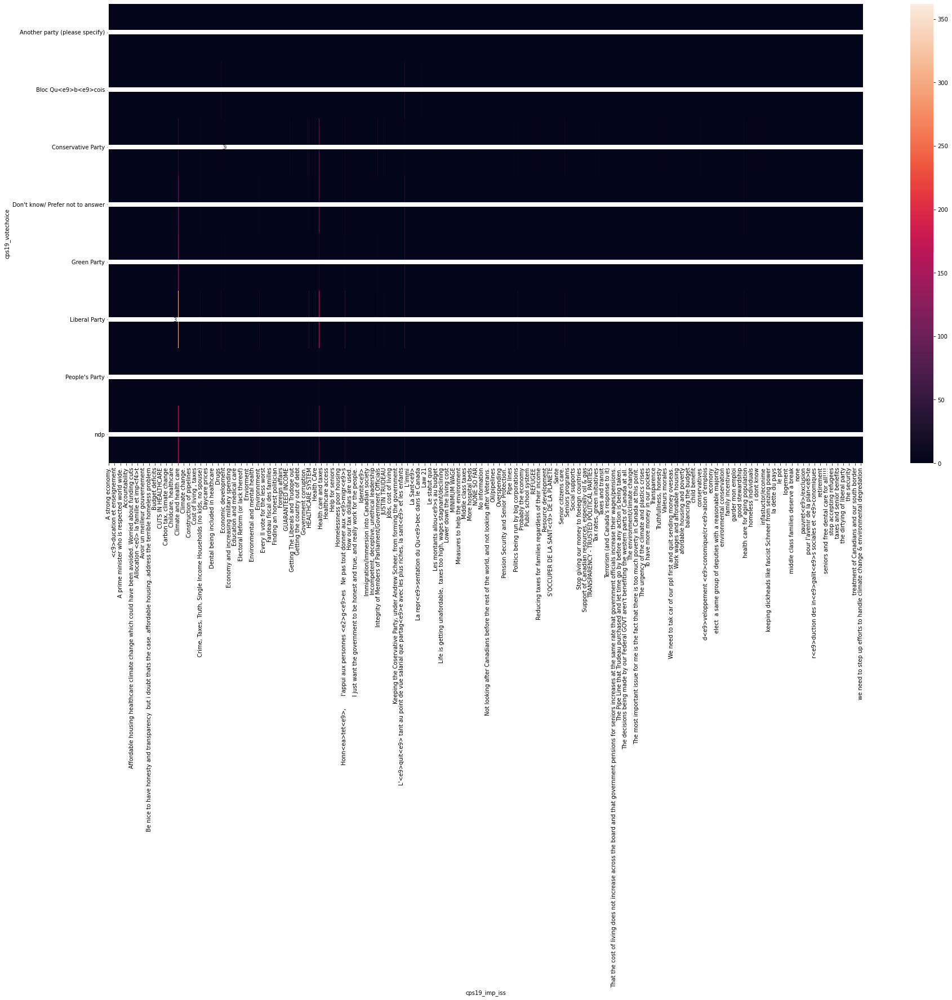

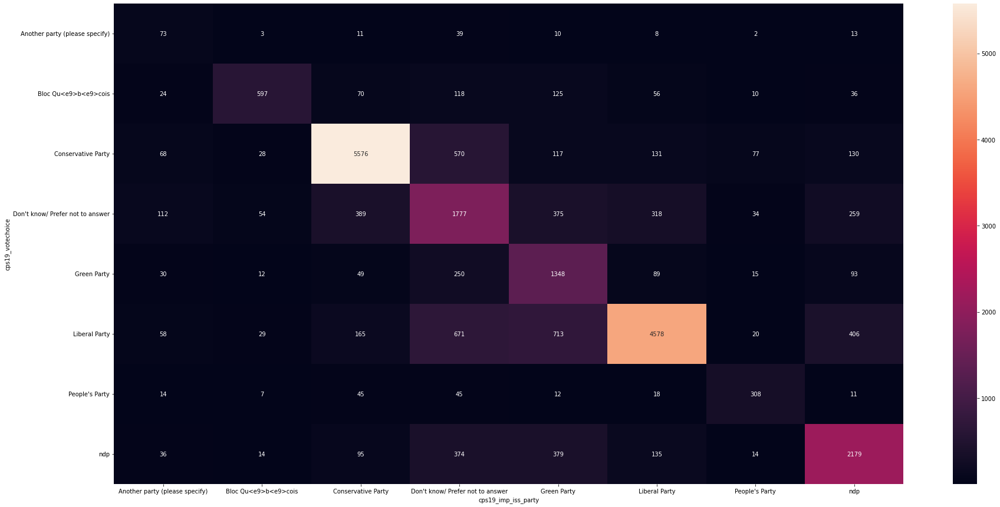

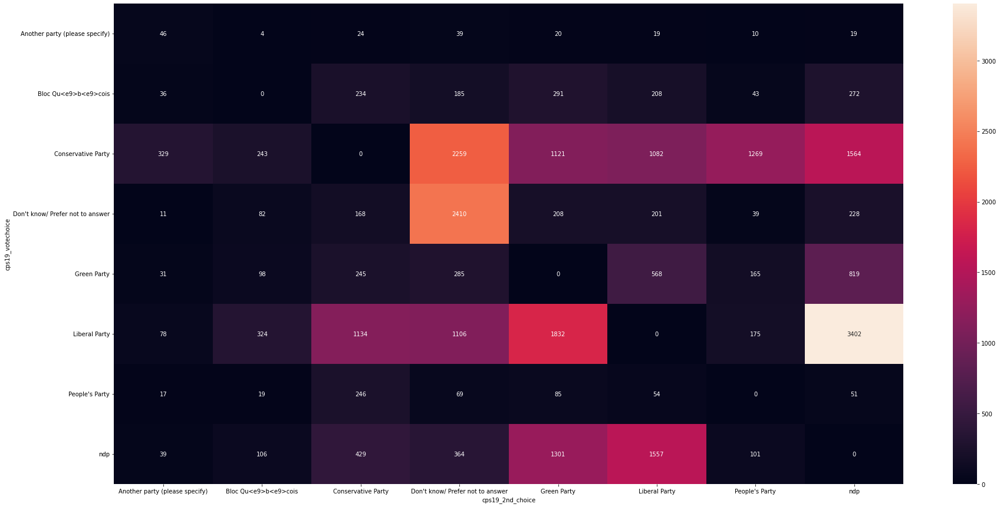

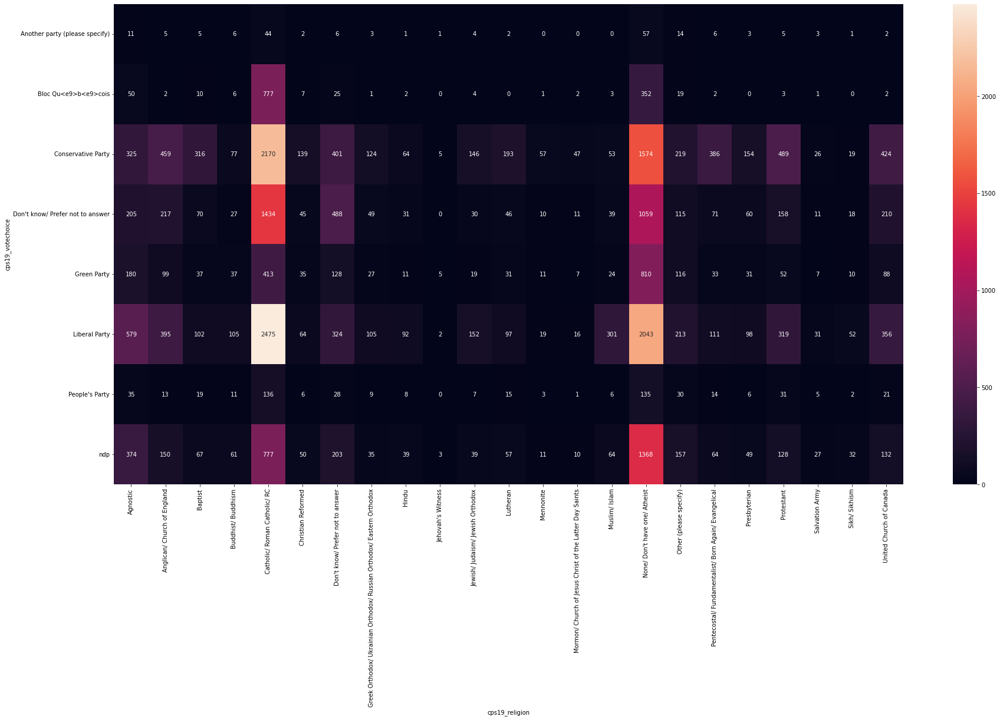

In [69]:
for col in my_columns:
    plt.figure(figsize=(30, 15))
    sns.heatmap(pd.crosstab(df['cps19_votechoice'], df[col]), annot=True, fmt='d')

In [ ]:
1- country
2- topic
3- push
4- sibling
5- luggage
6- man
7- vacant
8- deal
9- forum
10- will
11- athlete
12- slogan